# EEG Based Emotion Recognition

## Prelminary Tasks

In [3]:
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd
import scipy.io as sio
from scipy import stats
import mne, glob
import os

In [4]:
#Defining the paths for the data folders

RAW_DATA_PATH = '/home/ankit/Development/EEG Emotion Classification/Data/raw_data'
FILTERED_DATA_PATH = '/home/ankit/Development/EEG Emotion Classification/Data/filtered_data'
ARTIFACTS_PATH = '/home/ankit/Development/EEG Emotion Classification/Data/artifact_removal'

In [5]:
filtered_files = glob.glob(os.path.join(FILTERED_DATA_PATH, '*.mat'))
print(f"Found {len(filtered_files)} filtered data files")

metadata = []
eeg_data = []

#loading all the filtered data files
for file_path in filtered_files:
    filename = os.path.basename(file_path)  #extracts only the file name

    #eg file name = Arithmetoc_sub_10_trial1.mat
    parts = filename.split('_')
    task_type = parts[0]
    subject_id = parts[2]
    trial_num = parts[3].split('.')[0].replace('trial','')
    # Add numeric versions for correct sorting
    subject_id_num = int(subject_id) if subject_id.isdigit() else 9999
    trial_num_num = int(trial_num) if trial_num.isdigit() else 9999


    mat_data = sio.loadmat(file_path)

    if 'Clean_data' in mat_data:
        metadata.append({
            'task_type' : task_type,
            'subject_id': subject_id,
            'trial_num': trial_num,
            'subject_id_num': subject_id_num,
            'trial_num_num': trial_num_num,
            'filename' : filename,
            'data_shape' : str(mat_data['Clean_data'].shape)
        })
        eeg_data.append(mat_data['Clean_data'])
    else: 
        print(f"Warning: 'Clean_data' key not found in {filename}")


Found 480 filtered data files


In [6]:
#Putting the metadata into a dataframe

eeg_df = pd.DataFrame(metadata)

eeg_df['data'] = eeg_data

print(eeg_df.head())
print(f"\nTotal rrecords:{len(eeg_df)}")

print(f"\nUnique task types: {eeg_df['task_type'].unique()}")
print(f"Number of subjects: {eeg_df['subject_id'].nunique()}")
print(f"Average data shape: {eeg_df['data_shape'].mode()[0] if not eeg_df.empty else 'No data'}")

    task_type subject_id trial_num  subject_id_num  trial_num_num  \
0  Arithmetic         10         1              10              1   
1  Arithmetic         10         2              10              2   
2  Arithmetic         10         3              10              3   
3  Arithmetic         11         1              11              1   
4  Arithmetic         11         2              11              2   

                       filename  data_shape  \
0  Arithmetic_sub_10_trial1.mat  (32, 3200)   
1  Arithmetic_sub_10_trial2.mat  (32, 3200)   
2  Arithmetic_sub_10_trial3.mat  (32, 3200)   
3  Arithmetic_sub_11_trial1.mat  (32, 3200)   
4  Arithmetic_sub_11_trial2.mat  (32, 3200)   

                                                data  
0  [[-6.327675159366827, -2.757696170968117, 3.13...  
1  [[-8.180211415335654, -1.7256052613619104, 5.0...  
2  [[2.1801621111701333, 1.9534593052069575, 2.16...  
3  [[-10.878432888606437, 2.7628508684513124, 12....  
4  [[0.4282859551279625, -3

## Exploratory Data Analysis and EEG Analysis

### Time Domain Analysis


 Sorted - first few rows:
    subject_id trial_num   task_type
30           1         1  Arithmetic
31           1         2  Arithmetic
32           1         3  Arithmetic
270          1         1       Relax
271          1         2       Relax
272          1         3       Relax
390          1         1      Stroop
391          1         2      Stroop
392          1         3      Stroop
63           2         1  Arithmetic

Sample data for Subject 1:
    subject_id trial_num   task_type
30           1         1  Arithmetic
31           1         2  Arithmetic
32           1         3  Arithmetic
270          1         1       Relax
271          1         2       Relax
272          1         3       Relax
390          1         1      Stroop
391          1         2      Stroop
392          1         3      Stroop
Available subjects: ['1', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', 

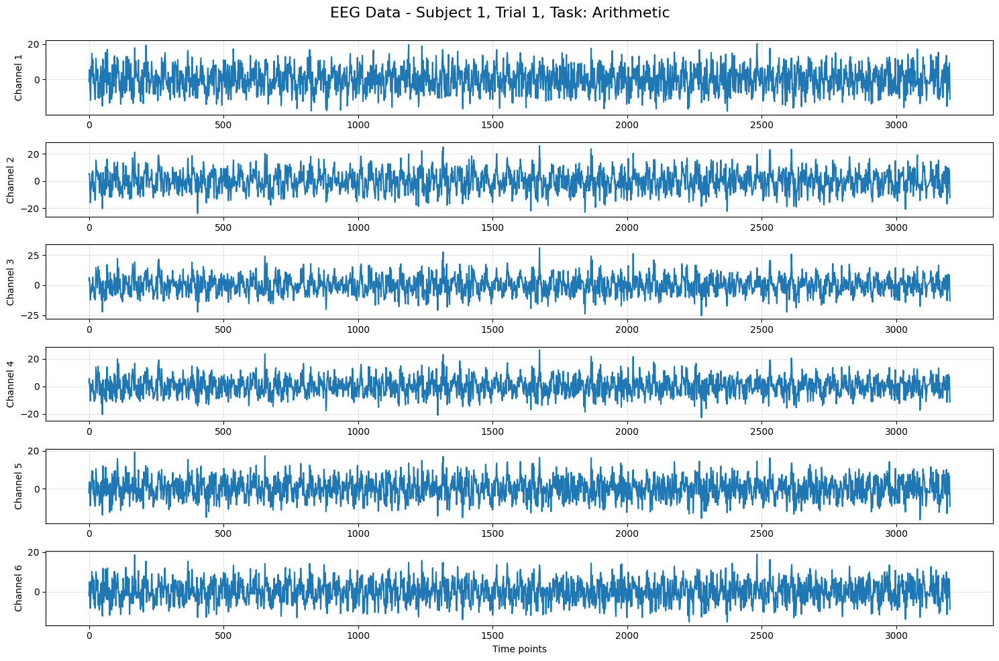


Plotting random entry:
Randomly selected: Subject 38, Trial 1, Task: Relax


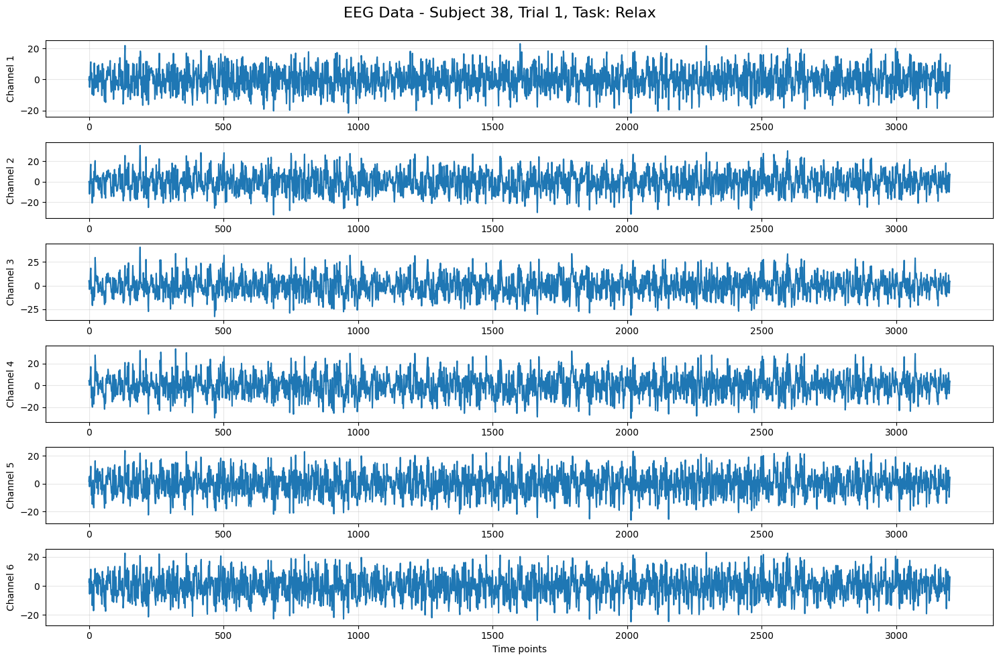


Plotting random sample for task type 'Relax':
Randomly selected: Subject 20, Trial 1, Task: Relax


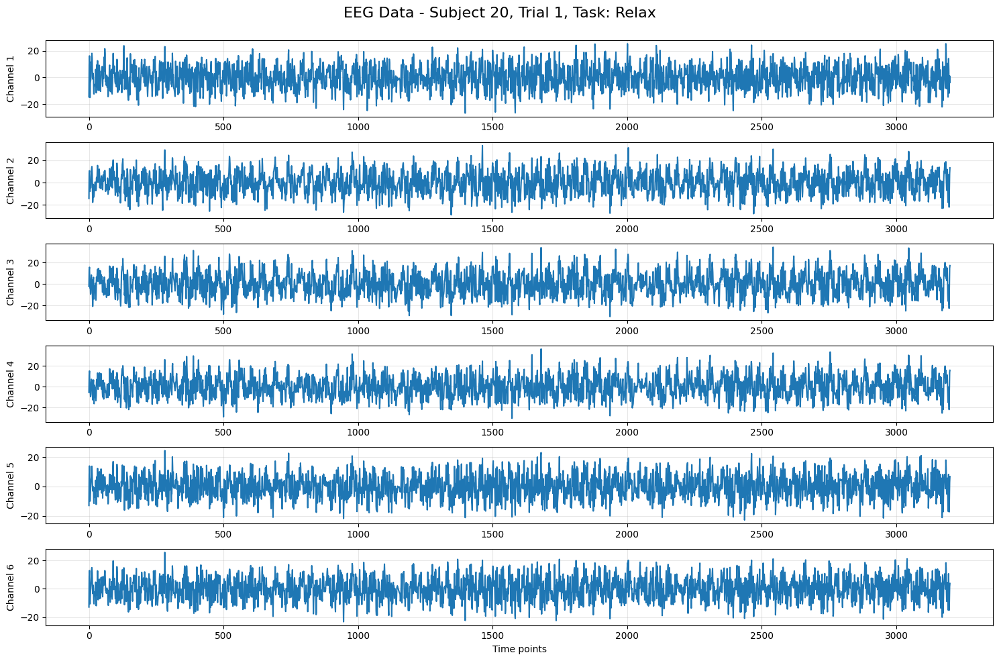

In [7]:
# Signal Visualisation
eeg_df = pd.DataFrame(metadata)
eeg_df['data'] = eeg_data


# Sort by subject_id (numerically), then task_type, then trial_num (numerically)
eeg_df_sorted = eeg_df.sort_values(['subject_id_num', 'task_type', 'trial_num_num'])

# Display the sorted result to verify
print("\n Sorted - first few rows:")
print(eeg_df_sorted[['subject_id', 'trial_num', 'task_type']].head(10))

# Print a sample of the first subject's data to verify sorting
first_subject = eeg_df_sorted['subject_id'].iloc[0]
print(f"\nSample data for Subject {first_subject}:")
print(eeg_df_sorted[eeg_df_sorted['subject_id'] == first_subject][['subject_id', 'trial_num', 'task_type']].head(10))

# Function to plot data from your DataFrame
def plot_from_dataframe(subject_id=None, trial_num=None, task_type=None, random=False):
    """
    Plot EEG data for a specific subject and trial or a random sample.
    
    Args:
        subject_id: Subject ID to plot (or None for random selection)
        trial_num: Trial number to plot (or None for random selection)
        task_type: Filter by task type
        random: If True, select a random sample regardless of other parameters
    """
    # If random selection is requested
    if random or (subject_id is None and trial_num is None):
        if task_type is not None:
            # Random sample from specific task type
            filtered_df = eeg_df_sorted[eeg_df_sorted['task_type'] == task_type]
            if filtered_df.empty:
                print(f"No data found for task type {task_type}")
                return
        else:
            filtered_df = eeg_df_sorted
            
        # Select a random row
        row = filtered_df.sample(1).iloc[0]
        subject_id = row['subject_id'] 
        trial_num = row['trial_num']
        print(f"Randomly selected: Subject {subject_id}, Trial {trial_num}, Task: {row['task_type']}")
    else:
        # Use the provided subject_id and trial_num
        query_conditions = []
        
        if subject_id is not None:
            query_conditions.append(f"subject_id == '{subject_id}'")
        
        if trial_num is not None:
            query_conditions.append(f"trial_num == '{trial_num}'")
            
        if task_type is not None:
            query_conditions.append(f"task_type == '{task_type}'")
            
        if not query_conditions:
            print("No selection criteria provided. Using first row.")
            row = eeg_df_sorted.iloc[0]
        else:
            query_str = " and ".join(query_conditions)
            filtered_data = eeg_df_sorted.query(query_str)
            
            if filtered_data.empty:
                print(f"No data found matching the criteria: {query_str}")
                return
            
            if len(filtered_data) > 1:
                print(f"Found {len(filtered_data)} matching entries. Using the first one.")
            
            row = filtered_data.iloc[0]
    
    # Plot the data
    eeg_data = row['data']
    subject_id = row['subject_id']
    trial_num = row['trial_num']
    task = row['task_type']
    
    # Get information about the data
    n_channels = eeg_data.shape[0]
    n_timepoints = eeg_data.shape[1]
    
    # Create a figure with subplots for each channel
    channels_to_plot = min(6, n_channels)
    
    plt.figure(figsize=(15, 10))
    
    for i in range(channels_to_plot):
        plt.subplot(channels_to_plot, 1, i+1)
        plt.plot(eeg_data[i, :])
        plt.ylabel(f'Channel {i+1}')
        plt.grid(True, alpha=0.3)
        
        # Only add x-label to the bottom subplot
        if i == channels_to_plot-1:
            plt.xlabel('Time points')
    
    # Add title with information about the data
    plt.suptitle(f"EEG Data - Subject {subject_id}, Trial {trial_num}, Task: {task}", 
                fontsize=16)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.93)  # Make room for the title
    plt.show()
    
    return eeg_data

# Example usage - now showing a variety of plots
print("Available subjects:", sorted(eeg_df_sorted['subject_id'].unique()))
print("Available task types:", sorted(eeg_df_sorted['task_type'].unique()))

# Plot first entry (will display subject/trial info)
print("\nPlotting first entry:")
plot_from_dataframe(subject_id=eeg_df_sorted['subject_id'].iloc[0], 
                   trial_num=eeg_df_sorted['trial_num'].iloc[0])

# Plot a random entry
print("\nPlotting random entry:")
plot_from_dataframe(random=True)

# Plot a specific task type (random sample)
if len(eeg_df_sorted['task_type'].unique()) > 1:
    task = eeg_df_sorted['task_type'].unique()[1]  # Pick second task type
    print(f"\nPlotting random sample for task type '{task}':")
    plot_from_dataframe(task_type=task, random=True)

In [8]:
#Statistical Measures
#creating a list to store channel statistics

channel_stats_list = []
for index, row in eeg_df_sorted.iterrows():
    #getting data of the current trial
    eeg_data = row['data']
    n_channels = eeg_data.shape[0]

    for ch_index in range(n_channels):
        channel_data = eeg_data[ch_index, :]

        mean_val = np.mean(channel_data)
        std_val = np.std(channel_data)

        skew_val = stats.skew(channel_data,axis=None)
        kurt_val = stats.kurtosis(channel_data,axis=None,fisher =True)

        #Creating a dicitionary with the metadata
        stats_dict = {
            "task_type" : row["task_type"],
            'subject_id': row['subject_id'], # Using the integer version
            'trial_num': row['trial_num'],   # Using the integer version
            'filename': row['filename'],     # Original filename
            'channel': ch_index + 1,         # Channel number (1-indexed)
            'mean': mean_val,
            'std_dev': std_val,
            'skewness': skew_val,
            'kurtosis': kurt_val
        } 

        channel_stats_list.append(stats_dict)

#new dataframe with the new list of statsitcs
stats_df = pd.DataFrame(channel_stats_list)

print("\nChannel Statistics DataFrame (first 10 rows): ")
display(stats_df.head(10))

print("\nSummary statistics of the calculated measures:")
display(stats_df[['mean', 'std_dev', 'skewness', 'kurtosis']].describe())


Channel Statistics DataFrame (first 10 rows): 


,task_type,subject_id,trial_num,filename,channel,mean,std_dev,skewness,kurtosis
0,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,1,-0.056164,6.449796,0.058378,-0.305267
1,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,2,-0.012965,7.172786,0.108844,-0.045991
2,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,3,-0.025411,7.028779,0.173547,0.296095
3,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,4,0.037379,6.132837,0.174760,0.236503
4,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,5,0.118167,5.194678,0.085537,-0.125479
5,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,6,0.061048,5.225538,0.071888,-0.158346
6,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,7,0.070861,5.028017,0.044851,-0.185117
7,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,8,0.019693,3.859926,0.033263,-0.249976
8,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,9,0.016949,4.811221,0.024594,-0.472119
9,Arithmetic,1,1,Arithmetic_sub_1_trial1.mat,10,0.017553,4.787502,-0.001123,-0.568349



Summary statistics of the calculated measures:


,mean,std_dev,skewness,kurtosis
count,15360.000000,15360.000000,15360.000000,15360.000000
mean,-0.014292,7.062640,0.025988,-0.266762
std,0.083010,2.006692,0.071887,0.183363
min,-0.799513,2.746163,-0.489207,-0.802345
25%,-0.057631,5.629370,-0.012485,-0.367683
50%,-0.011380,6.729923,0.019783,-0.287793
75%,0.033189,8.167330,0.055218,-0.199544
max,0.476593,19.677766,0.660968,1.443631


/tmp/ipykernel_32942/2686915680.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='task_type', y='mean', data=task_stats, palette=box_palette, ax=ax2)
/tmp/ipykernel_32942/2686915680.py:38: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')


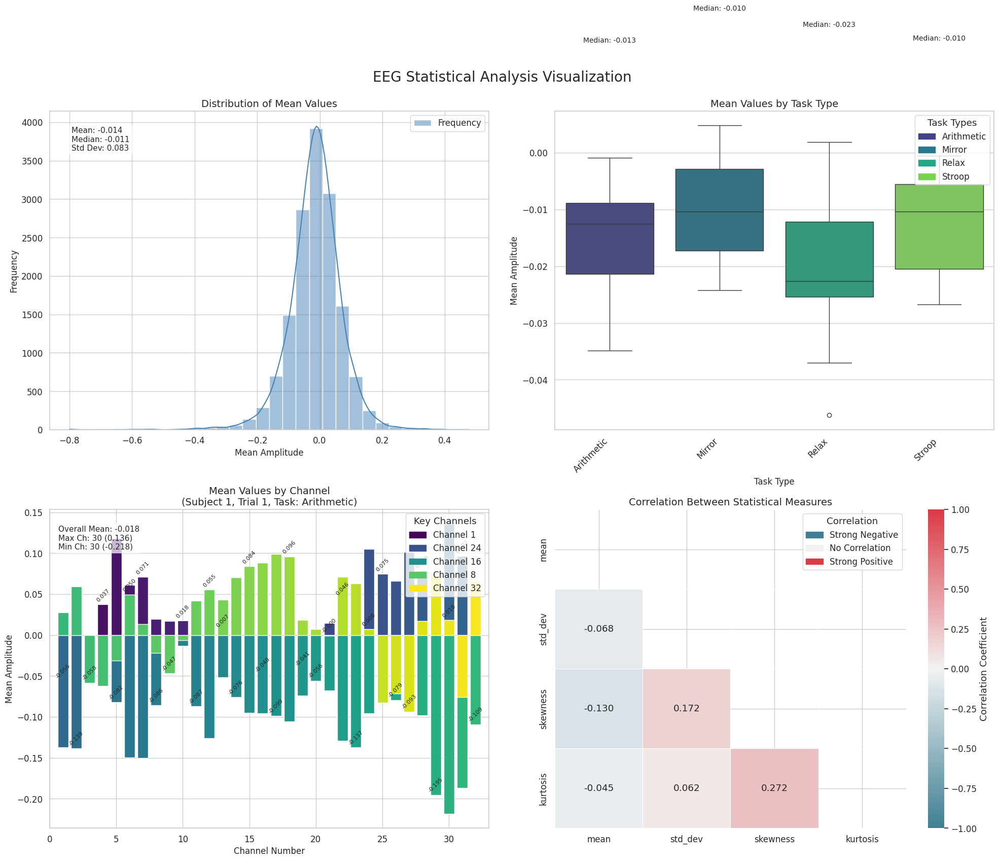

In [9]:
#Visualizing the measures better
# Set style for better visualization
sns.set(style="whitegrid", font_scale=1.1)

# Create a single figure with multiple subplots
fig = plt.figure(figsize=(20, 16))
fig.suptitle('EEG Statistical Analysis Visualization', fontsize=20, y=0.98)

# 1. Distribution of mean values across all channels
ax1 = plt.subplot(2, 2, 1)
sns.histplot(stats_df['mean'], kde=True, bins=30, ax=ax1, color='steelblue', label='Frequency')
ax1.set_title('Distribution of Mean Values', fontsize=14)
ax1.set_xlabel('Mean Amplitude', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.legend()

# Add key statistics as text annotations
mean_val = stats_df['mean'].mean()
median_val = stats_df['mean'].median()
std_val = stats_df['mean'].std()
info_text = f"Mean: {mean_val:.3f}\nMedian: {median_val:.3f}\nStd Dev: {std_val:.3f}"
props = dict(boxstyle='round', facecolor='white', alpha=0.7)
ax1.annotate(info_text, xy=(0.05, 0.95), xycoords='axes fraction', 
            fontsize=11, va='top', bbox=props)

# 2. Boxplot comparing all statistics by task type
ax2 = plt.subplot(2, 2, 2)
task_stats = stats_df.groupby(['task_type', 'channel']).agg({
    'mean': 'mean',
    'std_dev': 'mean'
}).reset_index()

box_palette = sns.color_palette("viridis", len(task_stats['task_type'].unique()))
sns.boxplot(x='task_type', y='mean', data=task_stats, palette=box_palette, ax=ax2)
ax2.set_title('Mean Values by Task Type', fontsize=14)
ax2.set_xlabel('Task Type', fontsize=12)
ax2.set_ylabel('Mean Amplitude', fontsize=12)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')

# Add a legend for task types
handles = [plt.Rectangle((0,0),1,1, color=box_palette[i]) for i in range(len(task_stats['task_type'].unique()))]
ax2.legend(handles, task_stats['task_type'].unique(), title="Task Types", loc='upper right')

# Add median values on top of each box
for i, task in enumerate(task_stats['task_type'].unique()):
    task_median = task_stats[task_stats['task_type'] == task]['mean'].median()
    ax2.text(i, task_stats[task_stats['task_type'] == task]['mean'].max() + 0.02, 
            f'Median: {task_median:.3f}', 
            ha='center', va='bottom', fontsize=10, 
            bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))

# 3. Channel comparison for a single subject and trial
ax3 = plt.subplot(2, 2, 3)
# Select a specific subject and trial for analysis
subject_id = stats_df['subject_id'].iloc[0]  
trial_num = stats_df['trial_num'].iloc[0]   
task_type = stats_df[(stats_df['subject_id'] == subject_id) & 
                    (stats_df['trial_num'] == trial_num)]['task_type'].iloc[0]

# Get data for that subject and trial
single_trial_data = stats_df[
    (stats_df['subject_id'] == subject_id) & 
    (stats_df['trial_num'] == trial_num)
]

# Limit display to first 32 channels
if len(single_trial_data) > 32:
    plot_data = single_trial_data[single_trial_data['channel'] <= 32]
else:
    plot_data = single_trial_data

channel_colors = sns.color_palette('viridis', len(plot_data))
bars = ax3.bar(plot_data['channel'], plot_data['mean'], 
        color=channel_colors, label=[f'Ch {i+1}' for i in range(len(plot_data))])
ax3.set_title(f'Mean Values by Channel\n(Subject {subject_id}, Trial {trial_num}, Task: {task_type})', 
        fontsize=14)
ax3.set_xlabel('Channel Number', fontsize=12)
ax3.set_ylabel('Mean Amplitude', fontsize=12)
ax3.set_xlim(0, 33)  # Set x-axis limit to 32 channels

# Add a custom legend with key channels
channel_indices = np.linspace(0, len(plot_data)-1, min(5, len(plot_data)), dtype=int)
legend_handles = [plt.Rectangle((0,0),1,1, color=channel_colors[i]) for i in channel_indices]
legend_labels = [f'Channel {int(plot_data.iloc[i]["channel"])}' for i in channel_indices]
ax3.legend(legend_handles, legend_labels, loc='upper right', title="Key Channels")

# Add values on top of bars selectively to avoid overcrowding
for i, bar in enumerate(bars):
    if i % 3 == 0:  # Only show every 3rd label to avoid crowding
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height + 0.002,
                f'{height:.3f}',
                ha='center', va='bottom', fontsize=8, rotation=45)

# Add overall statistics
overall_mean = plot_data['mean'].mean()
max_channel = plot_data.loc[plot_data['mean'].idxmax()]['channel']
min_channel = plot_data.loc[plot_data['mean'].idxmin()]['channel']
info_text = (f"Overall Mean: {overall_mean:.3f}\n"
            f"Max Ch: {int(max_channel)} ({plot_data['mean'].max():.3f})\n"
            f"Min Ch: {int(min_channel)} ({plot_data['mean'].min():.3f})")

props = dict(boxstyle='round', facecolor='white', alpha=0.7)
ax3.annotate(info_text, xy=(0.02, 0.95), xycoords='axes fraction', 
            fontsize=11, va='top', bbox=props)

# 4. Correlation between statistical measures
ax4 = plt.subplot(2, 2, 4)
corr_cols = ['mean', 'std_dev', 'skewness', 'kurtosis']
corr_matrix = stats_df[corr_cols].corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Create mask for upper triangle
cmap = sns.diverging_palette(220, 10, as_cmap=True)  # Better colormap for correlation
heatmap = sns.heatmap(corr_matrix, annot=True, cmap=cmap, vmin=-1, vmax=1, 
                    fmt='.3f', linewidths=0.5, mask=mask, ax=ax4)
ax4.set_title('Correlation Between Statistical Measures', fontsize=14)

# Add a colorbar legend with clear labels
cbar = heatmap.collections[0].colorbar
cbar.set_label("Correlation Coefficient")

# Add correlation interpretations
strong_correlations = []
for i, col1 in enumerate(corr_cols):
    for j, col2 in enumerate(corr_cols):
        if i < j:  # Only look at lower triangle
            corr_val = corr_matrix.iloc[i, j]
            if abs(corr_val) > 0.6:  # Only show strong correlations
                direction = "+" if corr_val > 0 else "-"
                strong_correlations.append(f"{col1}/{col2}: {direction}{abs(corr_val):.2f}")

if strong_correlations:
    corr_text = "\n".join(strong_correlations)
    ax4.annotate(f"Strong Correlations:\n{corr_text}", 
                xy=(0.02, 0.02), xycoords='axes fraction',
                fontsize=10, va='bottom', bbox=props)

# Add a legend explaining the correlation scale
corr_handles = [plt.Rectangle((0,0),1,1, color=cmap(0.0)), 
                plt.Rectangle((0,0),1,1, color=cmap(0.5)),
                plt.Rectangle((0,0),1,1, color=cmap(1.0))]
ax4.legend(corr_handles, ["Strong Negative", "No Correlation", "Strong Positive"], 
           title="Correlation", loc="upper right")

# Adjust layout and spacing
plt.tight_layout()
plt.subplots_adjust(top=0.93, hspace=0.25, wspace=0.15)
plt.show()

### Frequency Domain Analysis

In [10]:
from scipy.signal import welch

FS = 128 #Sampling rate for the resultant frequency band

WINDOW_TYPE = 'hann' # hanning window for the psd calculiton
NPERSEG = FS * 2 # segment length for welch's method
FREQ_BANDS = {
    "Delta" : [0.5,4],
    "Theta" : [4,8],
    "Alpha":[8,13],
    "Beta" : [13,30],
    "Gamma":[30,min(50,FS/2 -1)] # limiting gamma to nyquist frequency to avoid distortions
}

#Colors for plotting bands 
BAND_COLORS= {
    "Delta": "gray",
    "Theta": "red",
    "Alpha": "blue",
    "Beta" : "purple",
    "Gamma": "green"
}
print(f"--- Configuration ---")
print(f"Data Path: {FILTERED_DATA_PATH}")
print(f"Sampling Frequency (Fs): {FS} Hz")
print(f"Welch Window: {WINDOW_TYPE}, Segment Length (NPERSEG): {NPERSEG}")
print(f"Frequency Bands: {FREQ_BANDS}")
print("-" * 20)

def calculate_psd_welch(data_channel,fs,nperseg,window):
    try:
        freqs, psd = welch(data_channel,fs=fs,nperseg=nperseg, window = window, nfft = nperseg)
        return freqs,psd
    except ValueError as e:
        # Handles cases like segment length > data length
        return None, None 
    except Exception as e: # Catch other potential errors
        print(f"  Unexpected Welch error: {e}")
        return None, None

def calculate_band_powers(freqs,psd,bands):
    if freqs is None or psd is None or len(freqs) <2 :
        keys = bands.keys()
        return {k:0 for k in keys }, {k: 0 for k in keys } # return 0s if PSD Fails
    
    freq_res = freqs[1] - freqs[0]
    total_power = np.sum(psd) * freq_res
    abs_band_powers, rel_band_powers = {}, {}

    #Ensuring band range is valid and within available frequencies 
    for band, f_range in bands.items():
        valid_freq_indices = np.where((freqs>=f_range[0])&(freqs<f_range[1]))[0]

        abs_power = np.sum(psd[valid_freq_indices]) * freq_res if len(valid_freq_indices) > 0 else 0
        abs_band_powers[band] = abs_power
        rel_band_powers[band] = (abs_power/total_power) if total_power > 0 else 0

    return abs_band_powers,rel_band_powers

#Calculating psd and band powers for all data
all_band_powers = []

if not eeg_df_sorted.empty:
    print(f"Calculating PSD and band powers for all {len(eeg_df_sorted)} trial")

    for index,row in eeg_df_sorted.iterrows():
        trial_eeg_data = row['data']

        if trial_eeg_data is None or trial_eeg_data.size ==0:
            continue

        if trial_eeg_data.ndim !=2:
            continue
     
        n_channels, n_timepoints = trial_eeg_data.shape

        if n_timepoints < NPERSEG:
            continue
        
        #iterating through each channel
        for ch_index in range (n_channels):
            channel_data = trial_eeg_data[ch_index, :] 

            # PSD
            freqs, psd = calculate_psd_welch(channel_data,fs = FS, nperseg=NPERSEG, window=WINDOW_TYPE)

            #Band powers
            abs_powers,rel_powers = calculate_band_powers(freqs,psd,FREQ_BANDS)

            #storing results
            power_dict = {
                'task_type': row['task_type'],
                'subject_id': row['subject_id'], # Use integer ID
                'trial_num': row['trial_num'],   # Use integer trial num
                'channel': ch_index + 1,             # 1-indexed channel
                'filename': row['filename']          # Keep original filename if needed
            }

            for band, power in rel_powers.items():
                power_dict[f'rel_{band}'] = power

            all_band_powers.append(power_dict)
            if (index + 1) % 50 == 0:
                print(f"  Processed {index + 1} / {len(eeg_df_sorted)} trials...")
            
            print("PSD and Band power calculation complete")

if all_band_powers:
    band_power_df = pd.DataFrame(all_band_powers)

    print("\nBand Powers (first 10 rows):")
    display(band_power_df.head(10))

    print("\nSummary statistics for relative band powers:")
    rel_power_cols = [f'rel_{band}' for band in FREQ_BANDS.keys()]
    display(band_power_df[rel_power_cols].describe())
else:
    print("No band power data was generated.")

print("\n--- Processing Finished ---")

--- Configuration ---
Data Path: /home/ankit/Development/EEG Emotion Classification/Data/filtered_data
Sampling Frequency (Fs): 128 Hz
Welch Window: hann, Segment Length (NPERSEG): 256
Frequency Bands: {'Delta': [0.5, 4], 'Theta': [4, 8], 'Alpha': [8, 13], 'Beta': [13, 30], 'Gamma': [30, 50]}
--------------------
Calculating PSD and band powers for all 480 trial
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation complete
PSD and Band power calculation comp

,task_type,subject_id,trial_num,channel,filename,rel_Delta,rel_Theta,rel_Alpha,rel_Beta,rel_Gamma
0,Arithmetic,1,1,1,Arithmetic_sub_1_trial1.mat,0.149297,0.163711,0.138129,0.348902,0.197552
1,Arithmetic,1,1,2,Arithmetic_sub_1_trial1.mat,0.228577,0.189177,0.142496,0.285352,0.149949
2,Arithmetic,1,1,3,Arithmetic_sub_1_trial1.mat,0.219410,0.180961,0.137332,0.279927,0.177057
3,Arithmetic,1,1,4,Arithmetic_sub_1_trial1.mat,0.183612,0.177604,0.135036,0.294484,0.204097
4,Arithmetic,1,1,5,Arithmetic_sub_1_trial1.mat,0.166835,0.165933,0.138226,0.321949,0.203282
5,Arithmetic,1,1,6,Arithmetic_sub_1_trial1.mat,0.161403,0.165603,0.141037,0.331397,0.197859
6,Arithmetic,1,1,7,Arithmetic_sub_1_trial1.mat,0.146545,0.162960,0.138682,0.338981,0.210462
7,Arithmetic,1,1,8,Arithmetic_sub_1_trial1.mat,0.123097,0.146447,0.140490,0.333958,0.253627
8,Arithmetic,1,1,9,Arithmetic_sub_1_trial1.mat,0.093277,0.088490,0.095178,0.443450,0.276955
9,Arithmetic,1,1,10,Arithmetic_sub_1_trial1.mat,0.076851,0.064827,0.072994,0.476041,0.304573



Summary statistics for relative band powers:


,rel_Delta,rel_Theta,rel_Alpha,rel_Beta,rel_Gamma
count,15360.000000,15360.000000,15360.000000,15360.000000,15360.000000
mean,0.140654,0.128490,0.141735,0.335972,0.250194
std,0.043924,0.032622,0.044825,0.036180,0.078058
min,0.049751,0.049159,0.047577,0.135020,0.046071
25%,0.112109,0.104685,0.112123,0.316199,0.192067
50%,0.134643,0.127980,0.135404,0.336817,0.247349
75%,0.158688,0.150271,0.160421,0.357106,0.307906
max,0.439734,0.252399,0.557503,0.697926,0.477808



--- Processing Finished ---


Generating visualizations...

Analyzing Channel 1
Subject 1, Trial 1
Task: Arithmetic


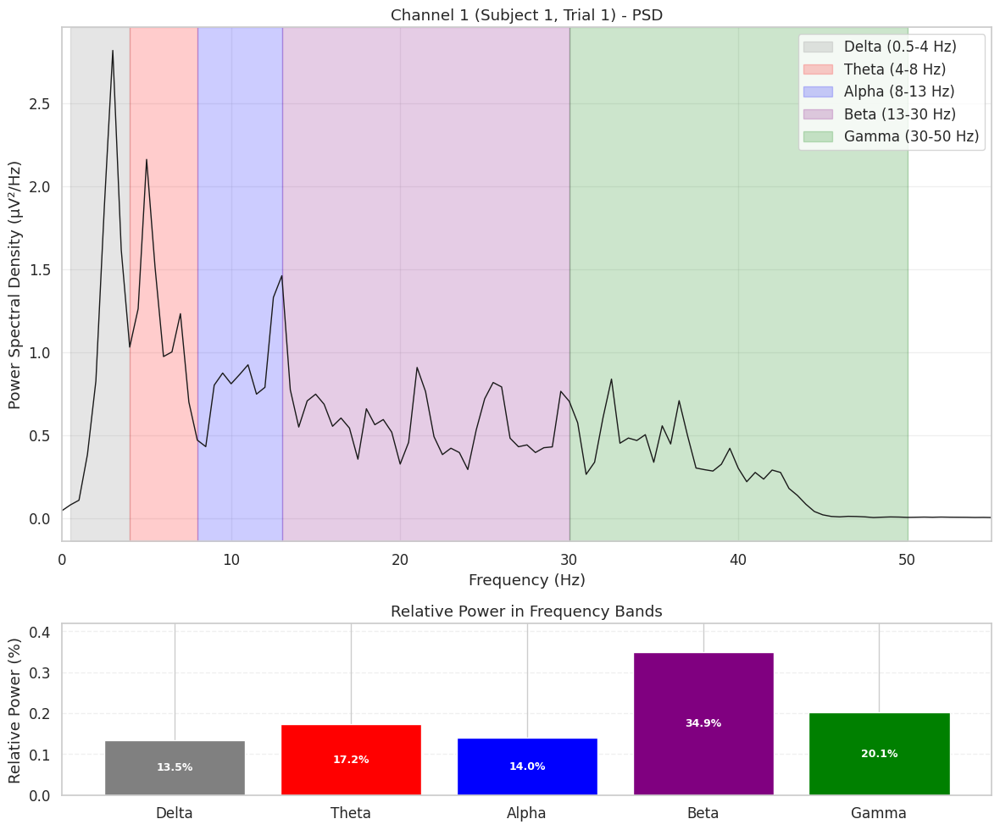


Generating task comparison plot...


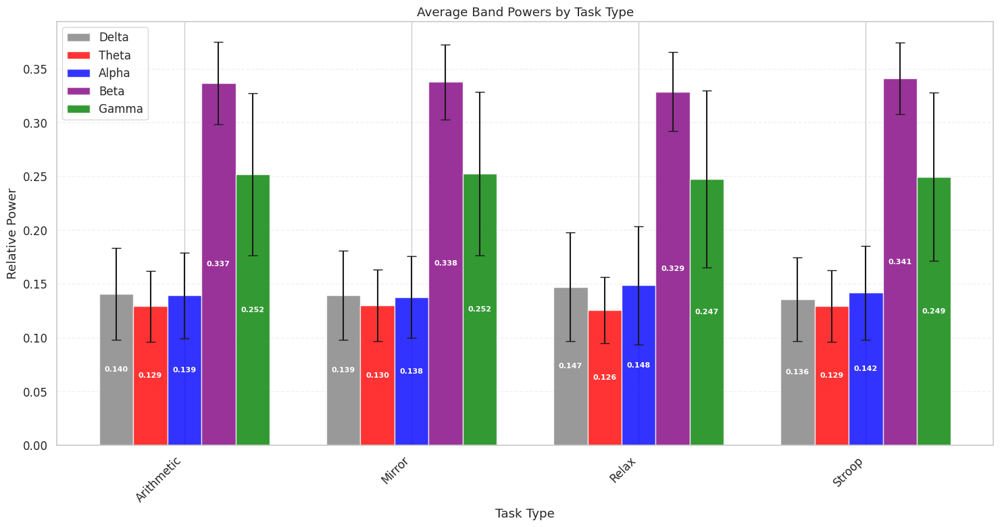


Generating channel-band heatmap...


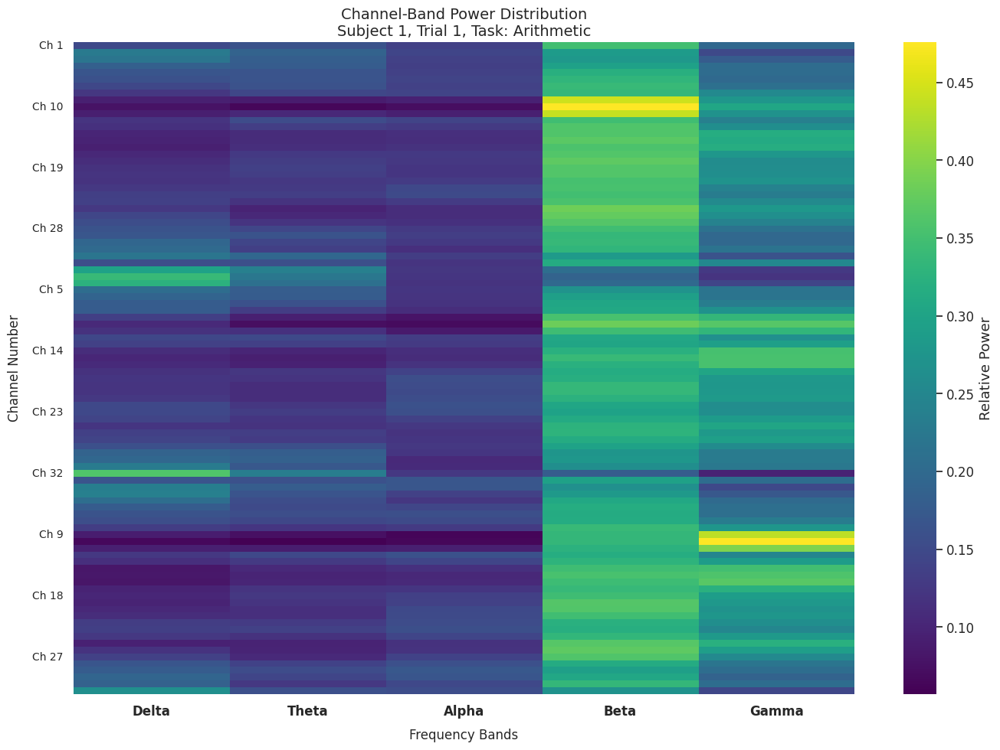

In [107]:
def plot_psd_and_bands(freqs, psd, rel_band_powers, bands, band_colors, title):
    """Visualizes the PSD curve and relative band powers with clear value labels."""
    fig, axes = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [3, 1]})
    
    # Plot PSD curve
    axes[0].plot(freqs, psd, color='k', linewidth=1)
    axes[0].set_xlabel('Frequency (Hz)')
    axes[0].set_ylabel('Power Spectral Density (µV²/Hz)')
    axes[0].set_title(title + ' - PSD')
    axes[0].set_xlim(0, min(FS/2, 55))
    axes[0].grid(True, alpha=0.3)
    
    # Shade frequency bands
    ylim = axes[0].get_ylim()
    for band, f_range in bands.items():
        axes[0].fill_between(f_range, ylim[0], ylim[1], 
                           color=band_colors.get(band, 'gray'), 
                           alpha=0.2, 
                           label=f'{band} ({f_range[0]}-{f_range[1]} Hz)')
    axes[0].set_ylim(ylim)
    axes[0].legend(loc='upper right')
    
    # Plot relative band power bar chart with improved labels
    band_names = list(rel_band_powers.keys())
    powers = list(rel_band_powers.values())
    colors = [band_colors.get(band, 'gray') for band in band_names]
    
    # Create the bars
    bars = axes[1].bar(band_names, powers, color=colors)
    axes[1].set_ylabel('Relative Power (%)')
    axes[1].set_title('Relative Power in Frequency Bands')
    
    # Set appropriate y-limit with some headroom for the text
    y_max = max(powers) if powers else 0
    axes[1].set_ylim(0, y_max * 1.2)
    
    # Add percentage labels inside the bars with improved positioning
    for bar in bars:
        height = bar.get_height()
        percentage = height * 100  # Convert to percentage
        
        # Position text in the middle of the bar
        text_x = bar.get_x() + bar.get_width() / 2
        
        # Determine text position and color based on bar height
        if height > y_max * 0.15:  # If bar is tall enough, put text inside
            text_y = height / 2  # Middle of the bar
            text_color = 'white'  # White text for contrast
            va = 'center'
        else:  # If bar is too short, put text above
            text_y = height + y_max * 0.02  # Just above the bar
            text_color = 'black'
            va = 'bottom'
        
        # Add the text with a slight background for readability
        axes[1].text(text_x, text_y, f'{percentage:.1f}%', 
                   ha='center', 
                   va=va,
                   color=text_color,
                   fontweight='bold',
                   fontsize=9,
                   bbox=dict(facecolor='none', alpha=0.5, pad=1, edgecolor='none'))
    
    # Add a thin horizontal grid to make value reading easier
    axes[1].grid(axis='y', alpha=0.3, linestyle='--')
    
    # Ensure x-labels are properly spaced and rotated if needed
    if len(band_names) > 5:
        plt.setp(axes[1].get_xticklabels(), rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

def plot_task_comparison(band_power_df):
    """Plot average band powers across different tasks with error bars and clear value labels."""
    band_cols = [col for col in band_power_df.columns if col.startswith('rel_')]
    
    # Calculate mean and standard error for each task and band
    task_stats = band_power_df.groupby('task_type')[band_cols].agg(['mean', 'std']).reset_index()
    
    # Prepare the plot
    plt.figure(figsize=(15, 8))
    bar_width = 0.15
    opacity = 0.8
    
    # Plot bars for each band
    for i, band in enumerate(FREQ_BANDS.keys()):
        col = f'rel_{band}'
        if col in band_cols:
            positions = np.arange(len(task_stats)) + i * bar_width
            means = task_stats[col]['mean']
            stds = task_stats[col]['std']
            
            # Create bars
            bars = plt.bar(positions, means, 
                         bar_width, 
                         alpha=opacity,
                         color=BAND_COLORS[band],
                         label=band,
                         yerr=stds,
                         capsize=5)
            
            # Add value labels inside or above the bars
            for j, bar in enumerate(bars):
                height = bar.get_height()
                value = means.iloc[j]
                
                # Determine position and color based on bar height
                if value > 0.03:  # Adjust threshold as needed
                    # Place inside bar
                    y_pos = height / 2
                    color = 'white'
                else:
                    # Place above bar
                    y_pos = height + 0.005
                    color = 'black'
                
                plt.text(bar.get_x() + bar.get_width()/2, y_pos,
                        f'{value:.3f}',
                        ha='center', va='center',
                        color=color, fontsize=8, fontweight='bold',
                        bbox=dict(facecolor='none', alpha=0.7, pad=1, edgecolor='none'))
    
    plt.xlabel('Task Type')
    plt.ylabel('Relative Power')
    plt.title('Average Band Powers by Task Type')
    plt.xticks(np.arange(len(task_stats)) + bar_width * 2, 
               task_stats['task_type'], 
               rotation=45, ha='right')
    plt.legend()
    plt.grid(axis='y', alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()

def plot_channel_band_heatmap(band_power_df, subject_id, trial_num):
    """Plot heatmap of band powers across channels for a specific trial without internal annotations."""
    trial_data = band_power_df[
        (band_power_df['subject_id'] == subject_id) & 
        (band_power_df['trial_num'] == trial_num)
    ]
    
    if trial_data.empty:
        print(f"No data found for Subject {subject_id}, Trial {trial_num}")
        return
        
    # Prepare data for heatmap
    band_cols = [f'rel_{band}' for band in FREQ_BANDS.keys()]
    channels = trial_data['channel'].values
    band_powers = trial_data[band_cols].values
    
    # Create a larger figure for better readability
    plt.figure(figsize=(14, 10))
    
    # Create cleaner y-axis labels (channel numbers) with proper spacing
    # Use only every nth channel label if there are too many channels
    n_channels = len(channels)
    if n_channels > 20:
        # Show fewer labels for readability
        step = n_channels // 10
        y_labels = [f"Ch {int(ch)}" if i % step == 0 else "" for i, ch in enumerate(channels)]
    else:
        # Show all channel labels
        y_labels = [f"Ch {int(ch)}" for ch in channels]
    
    # Create the heatmap with better formatting
    heatmap = sns.heatmap(band_powers, 
                        xticklabels=[band.replace('rel_', '') for band in band_cols],
                        yticklabels=y_labels,
                        cmap='viridis',
                        annot=False,  # No internal annotations
                        cbar_kws={'label': 'Relative Power'})
    
    # Format the x-axis (band) labels
    plt.xticks(rotation=0, fontsize=12, fontweight='bold')
    
    # Format the y-axis (channel) labels
    plt.yticks(fontsize=10, rotation=0)
    
    # Add a title with clear information
    task_type = trial_data['task_type'].iloc[0] if not trial_data.empty else "Unknown"
    plt.title(f'Channel-Band Power Distribution\nSubject {subject_id}, Trial {trial_num}, Task: {task_type}',
             fontsize=14)
    
    plt.xlabel('Frequency Bands', fontsize=12, labelpad=10)
    plt.ylabel('Channel Number', fontsize=12, labelpad=10)
    
    # Add gridlines for better readability
    heatmap.set_xticklabels(heatmap.get_xticklabels(), fontweight='bold')
    
    # Use tight_layout for better spacing
    plt.tight_layout()
    plt.show()

# --- Generate the visualizations ---
print("Generating visualizations...")

if len(eeg_df_sorted) > 0:
    # 1. PSD and Band Powers for a sample trial
    sample_row = eeg_df_sorted.iloc[0]
    sample_eeg_data = sample_row['data']
    channel_to_analyze = 0
    
    print(f"\nAnalyzing Channel {channel_to_analyze + 1}")
    print(f"Subject {sample_row['subject_id']}, Trial {sample_row['trial_num']}")
    print(f"Task: {sample_row['task_type']}")
    
    # Calculate PSD and band powers
    channel_data = sample_eeg_data[channel_to_analyze, :]
    freqs, psd = calculate_psd_welch(channel_data, fs=FS, nperseg=NPERSEG, window=WINDOW_TYPE)
    abs_powers, rel_powers = calculate_band_powers(freqs, psd, FREQ_BANDS)
    
    # Plot PSD and relative band powers
    plot_title = f"Channel {channel_to_analyze + 1} (Subject {sample_row['subject_id']}, Trial {sample_row['trial_num']})"
    plot_psd_and_bands(freqs, psd, rel_powers, FREQ_BANDS, BAND_COLORS, plot_title)
    
    # 2. Task comparison across all trials
    print("\nGenerating task comparison plot...")
    plot_task_comparison(band_power_df)
    
    # 3. Channel-Band heatmap for the sample trial
    print("\nGenerating channel-band heatmap...")
    plot_channel_band_heatmap(band_power_df, 
                             subject_id=sample_row['subject_id'],
                             trial_num=sample_row['trial_num'])

### Time Frequency Analysis


Running Continuous Wavelet Transform (CWT) analysis with consolidated visualizations...
Analyzing random selection: Subject 10, Trial 2, Task: Stroop
Data shape: 32 channels × 3200 time points
Processing 8 out of 32 channels...


Computing CWT: 100%|██████████| 8/8 [00:00<00:00, 301.09it/s]


Creating consolidated multi-channel visualization...


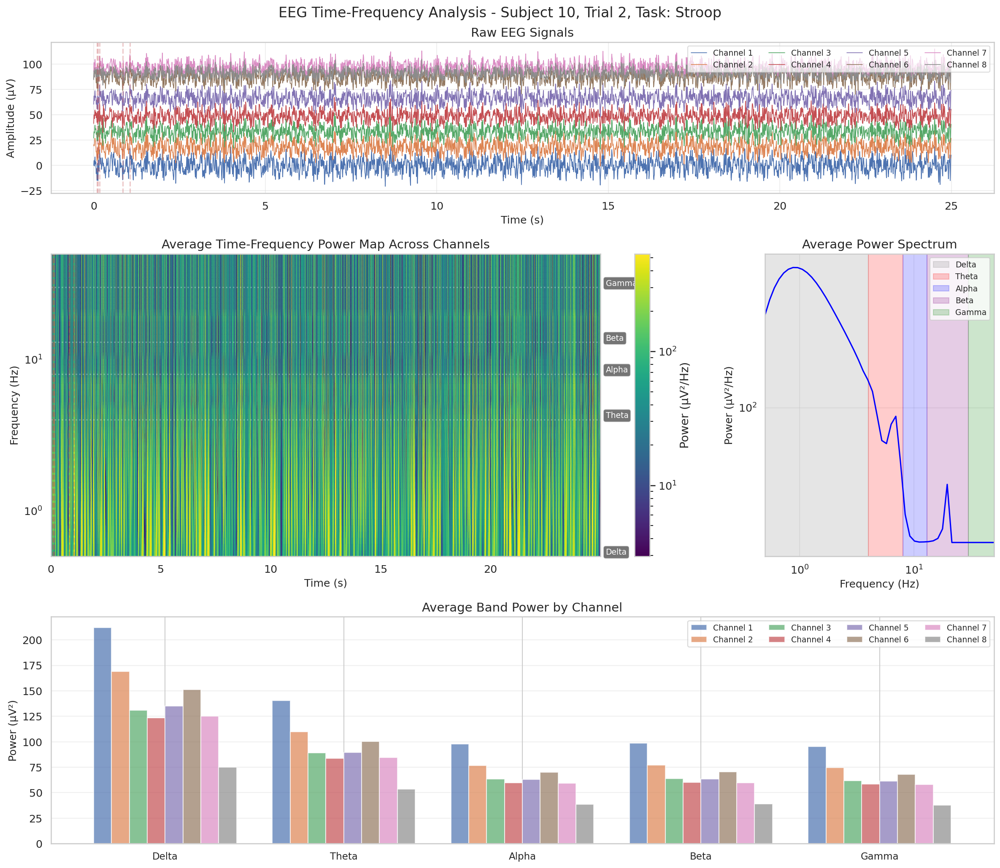


Creating coherence matrix visualization...


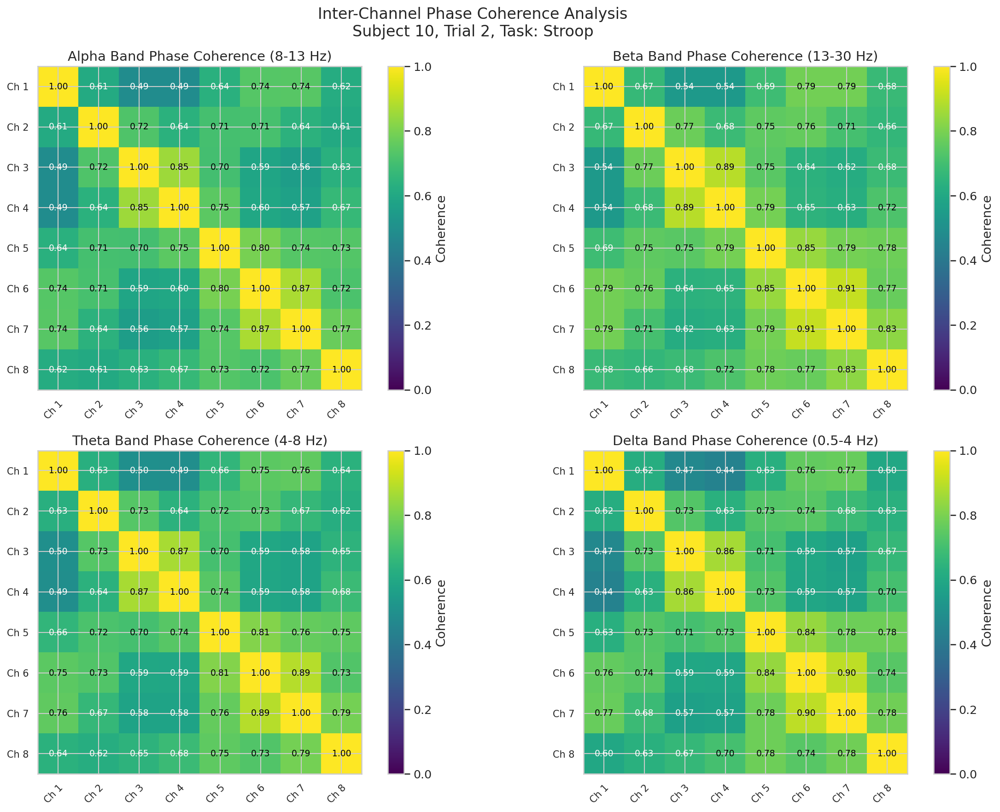


Comparing time-frequency signatures across different task types...
Comparing task types: Arithmetic, Relax, Stroop, Mirror

Processing task type: Arithmetic
  Processed Subject 12, Trial 3
  Processed Subject 12, Trial 2

Processing task type: Relax
  Processed Subject 26, Trial 1
  Processed Subject 26, Trial 2

Processing task type: Stroop
  Processed Subject 30, Trial 2
  Processed Subject 5, Trial 2

Processing task type: Mirror
  Processed Subject sub, Trial 6
  Processed Subject sub, Trial 2

Creating task comparison visualization...


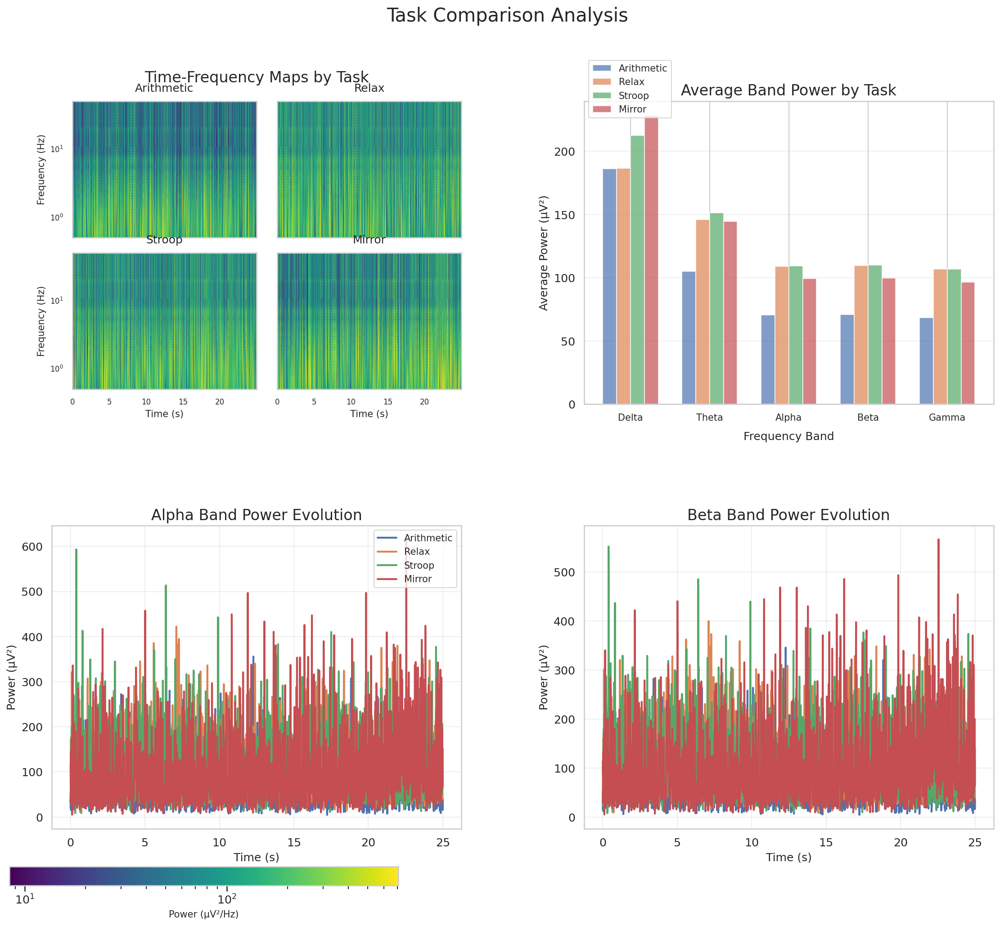

In [12]:
# Time-Frequency Analysis with Continuous Wavelet Transform - Improved Visualization
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LogNorm
from scipy import signal
import time
from tqdm import tqdm
import psutil
import os
from matplotlib.gridspec import GridSpec

# Configuration for CWT
FS = 128  # Sampling rate (Hz)
FREQ_RANGE = (0.5, 50)  # Frequency range of interest (Hz)
N_FREQS = 50  # Number of frequency points
CWT_WIDTH = 7.0  # Width of the Morlet wavelet
MAX_CHANNELS = 8  # Channels to analyze

def morlet_wavelet(freq, dt, width=7.0):
    """
    Create a Morlet wavelet for the given frequency.
    """
    # Calculate time-domain standard deviation
    sf = freq * width
    st = 1.0 / (2.0 * np.pi * sf)
    
    # Create time vector for the wavelet
    t = np.arange(-3.5*st, 3.5*st, dt)
    
    # Normalization factor
    A = 1.0 / (st * np.sqrt(2.0 * np.pi))
    
    # Morlet wavelet: Gaussian envelope * complex sinusoid
    wavelet = A * np.exp(-t**2/(2.0*st**2)) * np.exp(1j * 2.0 * np.pi * freq * t)
    
    # Normalize energy
    wavelet /= np.sqrt(0.5 * np.sum(np.abs(wavelet)**2))
    
    return wavelet

def compute_cwt(signal_data, fs, freq_range, n_freqs=50, width=7.0):
    """
    Compute the continuous wavelet transform for a signal using Morlet wavelets.
    """
    dt = 1.0/fs
    times = np.arange(len(signal_data)) * dt
    
    # Logarithmically spaced frequencies
    frequencies = np.logspace(np.log10(freq_range[0]), np.log10(freq_range[1]), n_freqs)
    
    # Matrix to store the time-frequency representation
    tfr = np.zeros((len(frequencies), len(signal_data)), dtype=np.complex128)
    
    # Compute the CWT for each frequency
    for i, freq in enumerate(frequencies):
        wavelet = morlet_wavelet(freq, dt, width)
        tfr[i, :] = signal.convolve(signal_data, wavelet, mode='same')
    
    return tfr, frequencies, times

def analyze_band_dynamics(tfr, frequencies, times, freq_bands):
    """Analyze the evolution of band power over time from CWT results."""
    power = np.abs(tfr)**2
    band_powers = {}
    
    for band_name, (f_min, f_max) in freq_bands.items():
        # Find indices of frequencies within the band
        freq_indices = np.where((frequencies >= f_min) & (frequencies <= f_max))[0]
        
        if len(freq_indices) > 0:
            # Average power across frequencies in the band
            band_power = np.mean(power[freq_indices, :], axis=0)
            band_powers[band_name] = band_power
        else:
            band_powers[band_name] = np.zeros_like(times)
    
    return band_powers

def calculate_phase_coherence(tfr1, tfr2, frequencies, freq_bands):
    """Calculate phase coherence between two channels for each frequency band."""
    coherence = {}
    
    for band_name, (f_min, f_max) in freq_bands.items():
        # Find frequency indices for this band
        freq_indices = np.where((frequencies >= f_min) & (frequencies <= f_max))[0]
        
        if len(freq_indices) > 0:
            # Extract phase for both channels in this band
            phase1 = np.angle(np.mean(tfr1[freq_indices, :], axis=0))
            phase2 = np.angle(np.mean(tfr2[freq_indices, :], axis=0))
            
            # Calculate phase difference
            phase_diff = np.exp(1j * (phase1 - phase2))
            
            # Phase coherence is the absolute value of the mean complex phase difference
            coherence[band_name] = np.abs(np.mean(phase_diff))
        else:
            coherence[band_name] = 0
    
    return coherence

def plot_consolidated_analysis(all_channel_data, all_tfr, all_frequencies, all_times, all_band_powers, channel_ids, subject_id, trial_num, task_type):
    """Create comprehensive subplot-based visualization with multiple channels in each subplot."""
    
    # Check if we have valid data
    if len(all_tfr) == 0:
        print("No valid data to plot")
        return None
    
    # Create figure with GridSpec for better control over subplot sizes
    fig = plt.figure(figsize=(16, 14), dpi=150)
    gs = GridSpec(3, 2, height_ratios=[1, 2, 1.5], width_ratios=[3, 1])
    
    # 1. Raw EEG Signals - Top row, spans both columns
    ax_raw = fig.add_subplot(gs[0, :])
    
    # Plot multiple channels with slight offset for clarity
    for i, (ch_id, channel_data) in enumerate(zip(channel_ids, all_channel_data)):
        # Add some offset to separate channels
        offset = i * np.std(channel_data) * 3
        ax_raw.plot(all_times[i], channel_data + offset, linewidth=0.8, 
                   label=f'Channel {ch_id}')
    
    # Add markers for significant events without arrows (using first channel as reference)
    if len(all_channel_data) > 0:
        peak_indices = signal.find_peaks(np.abs(all_channel_data[0]), height=np.std(all_channel_data[0])*2)[0]
        if len(peak_indices) > 5:
            peak_indices = peak_indices[:5]
        for peak_idx in peak_indices:
            if peak_idx < len(all_times[0]):
                ax_raw.axvline(all_times[0][peak_idx], color='r', alpha=0.3, linestyle='--')
    
    ax_raw.set_title(f'Raw EEG Signals', fontsize=14)
    ax_raw.set_ylabel('Amplitude (μV)', fontsize=12)
    ax_raw.set_xlabel('Time (s)', fontsize=12)
    ax_raw.grid(True, alpha=0.3)
    
    # Add legend with reasonable size and position
    ax_raw.legend(loc='upper right', fontsize=9, framealpha=0.7, ncol=min(4, len(channel_ids)))
    
    # 2. Time-Frequency Maps for all channels - Middle row, left column
    ax_tf = fig.add_subplot(gs[1, 0])
    
    # Calculate average power across all channels
    avg_power = np.zeros_like(np.abs(all_tfr[0])**2)
    for tfr in all_tfr:
        avg_power += np.abs(tfr)**2
    avg_power /= len(all_tfr)
    
    # Plot the average power with proper scaling
    vmin, vmax = np.percentile(avg_power, [1, 99])  # Use percentiles to handle outliers
    norm = LogNorm(vmin=max(vmin, 1e-15), vmax=vmax)
    
    im = ax_tf.pcolormesh(all_times[0], all_frequencies[0], avg_power, 
                      shading='gouraud', cmap='viridis', norm=norm)
    
    # Add markers at the same time points for alignment
    for peak_idx in peak_indices:
        if peak_idx < len(all_times[0]):
            ax_tf.axvline(all_times[0][peak_idx], color='r', alpha=0.3, linestyle='--')
    
    # Customize the frequency axis (logarithmic)
    ax_tf.set_yscale('log')
    ax_tf.set_title(f'Average Time-Frequency Power Map Across Channels', fontsize=14)
    ax_tf.set_xlabel('Time (s)', fontsize=12)
    ax_tf.set_ylabel('Frequency (Hz)', fontsize=12)
    ax_tf.set_ylim(FREQ_RANGE)
    
    # Add grid lines at standard frequency bands
    for band_name, (f_min, f_max) in FREQ_BANDS.items():
        ax_tf.axhline(f_min, color='w', alpha=0.3, linestyle=':')
        ax_tf.text(all_times[0][-1] * 1.01, f_min, band_name, color='w', 
                va='bottom', ha='left', fontsize=9, 
                bbox=dict(boxstyle="round", fc="k", alpha=0.6))
    
    # Add colorbar for the time-frequency plot
    cbar = fig.colorbar(im, ax=ax_tf, label='Power (μV²/Hz)')
    
    # 3. Average Power Spectrum - Middle row, right column
    ax_spectrum = fig.add_subplot(gs[1, 1])
    
    # Calculate and plot average power spectrum across all channels
    avg_spectrum = np.zeros_like(np.mean(np.abs(all_tfr[0])**2, axis=1))
    for tfr in all_tfr:
        avg_spectrum += np.mean(np.abs(tfr)**2, axis=1)
    avg_spectrum /= len(all_tfr)
    
    ax_spectrum.loglog(all_frequencies[0], avg_spectrum, color='blue', linewidth=1.5)
    ax_spectrum.set_title('Average Power Spectrum', fontsize=14)
    ax_spectrum.set_xlabel('Frequency (Hz)', fontsize=12)
    ax_spectrum.set_ylabel('Power (μV²/Hz)', fontsize=12)
    ax_spectrum.set_xlim(FREQ_RANGE)
    ax_spectrum.grid(True, alpha=0.3)
    
    # Add horizontal lines for frequency bands
    for band_name, (f_min, f_max) in FREQ_BANDS.items():
        color = BAND_COLORS.get(band_name, 'gray')
        ax_spectrum.axvspan(f_min, f_max, alpha=0.2, color=color, label=band_name)
    
    ax_spectrum.legend(fontsize=9, loc='upper right')
    
    # 4. Channel Band Power Comparison - Bottom row
    ax_bands = fig.add_subplot(gs[2, :])
    
    # For each band, plot its average power for each channel
    x = np.arange(len(FREQ_BANDS))
    bar_width = 0.8 / len(channel_ids)
    
    # Create a dictionary to store average band powers per channel
    channel_avg_band_powers = {}
    
    for i, (ch_id, band_powers) in enumerate(zip(channel_ids, all_band_powers)):
        channel_avg_band_powers[f'Channel {ch_id}'] = {}
        
        # Calculate average power in each band
        for band_name, power in band_powers.items():
            channel_avg_band_powers[f'Channel {ch_id}'][band_name] = np.mean(power)
    
    # Plot bars for each channel
    for i, (channel, band_powers) in enumerate(channel_avg_band_powers.items()):
        values = [band_powers[band] for band in FREQ_BANDS.keys()]
        positions = x + i*bar_width - (len(channel_ids)-1)*bar_width/2
        bars = ax_bands.bar(positions, values, width=bar_width, label=channel, alpha=0.7)
    
    # Customize the plot
    ax_bands.set_xticks(x)
    ax_bands.set_xticklabels(list(FREQ_BANDS.keys()), fontsize=11, rotation=0)
    ax_bands.set_title('Average Band Power by Channel', fontsize=14)
    ax_bands.set_ylabel('Power (μV²)', fontsize=12)
    ax_bands.grid(axis='y', alpha=0.3)
    
    # Add a clear, non-overlapping legend
    ax_bands.legend(loc='upper right', fontsize=9, ncol=min(4, len(channel_ids)))
    
    # Main title for all plots
    plt.suptitle(f'EEG Time-Frequency Analysis - Subject {subject_id}, Trial {trial_num}, Task: {task_type}', 
              fontsize=16, y=0.98)
    
    plt.tight_layout()
    return fig

def plot_coherence_matrix(all_tfr, all_frequencies, channel_ids, subject_id, trial_num, task_type):
    """Create a comprehensive coherence analysis visualization."""
    
    if len(all_tfr) < 2:
        print("Need at least 2 channels for coherence analysis")
        return None
    
    # Create figure
    fig = plt.figure(figsize=(16, 12), dpi=150)
    gs = GridSpec(2, 2)
    
    # 1. Alpha band coherence matrix - Top left
    ax_alpha = fig.add_subplot(gs[0, 0])
    plot_band_coherence_matrix(ax_alpha, all_tfr, all_frequencies, channel_ids, 'Alpha')
    
    # 2. Beta band coherence matrix - Top right
    ax_beta = fig.add_subplot(gs[0, 1])
    plot_band_coherence_matrix(ax_beta, all_tfr, all_frequencies, channel_ids, 'Beta')
    
    # 3. Theta band coherence matrix - Bottom left
    ax_theta = fig.add_subplot(gs[1, 0])
    plot_band_coherence_matrix(ax_theta, all_tfr, all_frequencies, channel_ids, 'Theta')
    
    # 4. Delta band coherence matrix - Bottom right
    ax_delta = fig.add_subplot(gs[1, 1])
    plot_band_coherence_matrix(ax_delta, all_tfr, all_frequencies, channel_ids, 'Delta')
    
    # Main title
    plt.suptitle(f'Inter-Channel Phase Coherence Analysis\nSubject {subject_id}, Trial {trial_num}, Task: {task_type}', 
              fontsize=16, y=0.98)
    
    plt.tight_layout()
    return fig

def plot_band_coherence_matrix(ax, all_tfr, all_frequencies, channel_ids, band_name):
    """Helper function to plot coherence matrix for a specific frequency band."""
    n_channels = len(all_tfr)
    coherence_matrix = np.zeros((n_channels, n_channels))
    
    # Calculate coherence between all channel pairs
    for i in range(n_channels):
        for j in range(n_channels):
            if i == j:
                coherence_matrix[i, j] = 1.0  # Perfect coherence with self
            else:
                # Calculate coherence between channels i and j
                coherence = calculate_phase_coherence(
                    all_tfr[i], all_tfr[j], all_frequencies[i], {band_name: FREQ_BANDS[band_name]}
                )
                coherence_matrix[i, j] = coherence.get(band_name, 0)
    
    # Plot coherence matrix as heatmap
    im = ax.imshow(coherence_matrix, cmap='viridis', vmin=0, vmax=1)
    
    # Add channel labels
    ax.set_xticks(np.arange(n_channels))
    ax.set_yticks(np.arange(n_channels))
    ax.set_xticklabels([f'Ch {ch_id}' for ch_id in channel_ids], fontsize=10)
    ax.set_yticklabels([f'Ch {ch_id}' for ch_id in channel_ids], fontsize=10)
    
    # Rotate the x-axis labels for better readability
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    # Add colorbar and title
    cbar = plt.colorbar(im, ax=ax, label=f'Coherence')
    ax.set_title(f'{band_name} Band Phase Coherence ({FREQ_BANDS[band_name][0]}-{FREQ_BANDS[band_name][1]} Hz)', 
               fontsize=14)
    
    # Add values in each cell
    for i in range(n_channels):
        for j in range(n_channels):
            ax.text(j, i, f'{coherence_matrix[i, j]:.2f}',
                  ha="center", va="center", 
                  color="white" if coherence_matrix[i, j] < 0.7 else "black",
                  fontsize=9)
    
    return im

def plot_task_comparison(task_avg_powers):
    """Create comprehensive task comparison visualizations with improved label clarity."""
    if len(task_avg_powers) <= 1:
        print("Need at least 2 tasks for comparison")
        return None
    
    # Create figure with GridSpec for better spacing control
    fig = plt.figure(figsize=(18, 14), dpi=150)
    gs = GridSpec(2, 2, hspace=0.4, wspace=0.3)
    
    # Get tasks and a sample of data structure
    tasks = list(task_avg_powers.keys())
    sample_power, sample_freqs, sample_times = task_avg_powers[tasks[0]]
    
    # 1. Time-Frequency Maps Comparison - top left
    ax_tf = fig.add_subplot(gs[0, 0])
    
    # Determine common color scale
    vmin, vmax = np.inf, -np.inf
    for task in tasks:
        power, _, _ = task_avg_powers[task]
        task_vmin, task_vmax = np.percentile(power, [1, 99])
        vmin = min(vmin, task_vmin)
        vmax = max(vmax, task_vmax)
    
    vmin = max(vmin, 1e-15)  # Ensure positive for log scale
    norm = LogNorm(vmin=vmin, vmax=vmax)
    
    # Create a neat grid layout for TF maps with better spacing
    n_tasks = len(tasks)
    ncols = min(2, n_tasks)
    nrows = (n_tasks + ncols - 1) // ncols  # Ceiling division
    
    # Clear the main axis for using the space with inset axes
    ax_tf.set_title('Time-Frequency Maps by Task', fontsize=16, pad=20)
    ax_tf.axis('off')
    
    # Add each task's TF map
    inset_axes = []
    for i, task in enumerate(tasks):
        power, freqs, times = task_avg_powers[task]
        
        # Create a properly positioned inset axes for each task
        # Use grid positions with proper padding
        width, height = 0.9/ncols, 0.9/nrows
        left = 0.05 + (i % ncols) * (width + 0.05)
        bottom = 0.05 + (nrows - 1 - i // ncols) * (height + 0.05)
        
        ax = ax_tf.inset_axes([left, bottom, width, height])
        inset_axes.append(ax)
        
        # Plot TF map
        im = ax.pcolormesh(times, freqs, power,
                        shading='gouraud', cmap='viridis', norm=norm)
        
        # Customize axes
        ax.set_yscale('log')
        ax.set_ylim(FREQ_RANGE)
        
        # Improve label spacing and clarity
        ax.set_title(f'{task}', fontsize=12, pad=10)
        
        # Clear labels that cause overlapping
        if i // ncols < nrows - 1:  # Not in bottom row
            ax.set_xlabel('')
            ax.set_xticklabels([])
        else:
            ax.set_xlabel('Time (s)', fontsize=10)
            # Reduce the number of x ticks to avoid overcrowding
            ax.xaxis.set_major_locator(plt.MaxNLocator(5))
        
        if i % ncols > 0:  # Not in leftmost column
            ax.set_ylabel('')
            ax.set_yticklabels([])
        else:
            ax.set_ylabel('Frequency (Hz)', fontsize=10)
        
        # Make tick labels smaller and rotate them for better fit
        ax.tick_params(axis='both', which='major', labelsize=8)
    
    # Add a colorbar for all TF plots
    cbar_ax = fig.add_axes([0.09, 0.05, 0.32, 0.02])  # [left, bottom, width, height]
    cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Power (μV²/Hz)', fontsize=10)
    
    # 2. Band power comparison across tasks - top right
    ax_band_comp = fig.add_subplot(gs[0, 1])
    
    # For each band, compare its average power across tasks
    task_band_avgs = {}
    for task in tasks:
        power, freqs, times = task_avg_powers[task]
        task_band_avgs[task] = {}
        
        for band_name, (f_min, f_max) in FREQ_BANDS.items():
            freq_indices = np.where((freqs >= f_min) & (freqs <= f_max))[0]
            if len(freq_indices) > 0:
                band_power = np.mean(power[freq_indices, :])
                task_band_avgs[task][band_name] = band_power
            else:
                task_band_avgs[task][band_name] = 0
    
    # Convert to a format suitable for plotting
    bands = list(FREQ_BANDS.keys())
    x = np.arange(len(bands))
    bar_width = 0.7 / len(tasks)
    
    # Plot bars for each task - more clearly spaced
    for i, task in enumerate(tasks):
        values = [task_band_avgs[task][band] for band in bands]
        position = x + i*bar_width - (len(tasks)-1)*bar_width/2
        ax_band_comp.bar(position, values, width=bar_width, label=task, alpha=0.7)
    
    # Improve x-axis label display
    ax_band_comp.set_xticks(x)
    ax_band_comp.set_xticklabels(bands, fontsize=10)
    ax_band_comp.set_xlabel('Frequency Band', fontsize=12, labelpad=10)
    ax_band_comp.set_ylabel('Average Power (μV²)', fontsize=12)
    ax_band_comp.set_title('Average Band Power by Task', fontsize=16)
    
    # Place legend outside the plot to avoid overlap
    ax_band_comp.legend(fontsize=10, loc='upper left', bbox_to_anchor=(0.0, 1.15))
    ax_band_comp.grid(axis='y', alpha=0.3)
    
    # 3. Band power evolution across tasks - bottom plots
    # Create one subplot for each band, limiting to two important bands
    bands_to_plot = ['Alpha', 'Beta']  # Just plot the two most relevant bands
    
    for i, band in enumerate(bands_to_plot):
        ax = fig.add_subplot(gs[1, i])
        
        # Plot each task's band power evolution
        for task in tasks:
            power, freqs, times = task_avg_powers[task]
            
            # Get the band power
            f_min, f_max = FREQ_BANDS[band]
            band_indices = np.where((freqs >= f_min) & (freqs <= f_max))[0]
            
            if len(band_indices) > 0:
                band_power = np.mean(power[band_indices, :], axis=0)
                ax.plot(times, band_power, label=task, linewidth=2)
        
        ax.set_title(f'{band} Band Power Evolution', fontsize=16)
        ax.set_xlabel('Time (s)', fontsize=12)
        ax.set_ylabel('Power (μV²)', fontsize=12)
        ax.grid(True, alpha=0.3)
        
        # Add legend with clear positioning to avoid overlap
        if i == 0:
            ax.legend(loc='upper right', fontsize=10)
    
    plt.suptitle('Task Comparison Analysis', fontsize=20, y=0.98)
    return fig

def run_cwt_analysis(eeg_df_sorted, subject_id=None, trial_num=None, task_type=None, random=True):
    """Run CWT analysis with consolidated visualizations for multiple channels."""
    # Select data to analyze
    if random or (subject_id is None and trial_num is None):
        if task_type is not None:
            filtered_df = eeg_df_sorted[eeg_df_sorted['task_type'] == task_type]
            if filtered_df.empty:
                print(f"No data found for task type {task_type}")
                return
        else:
            filtered_df = eeg_df_sorted
        
        # Select a random row
        row = filtered_df.sample(1).iloc[0]
        subject_id = row['subject_id']
        trial_num = row['trial_num']
        task_type = row['task_type']
        print(f"Analyzing random selection: Subject {subject_id}, Trial {trial_num}, Task: {task_type}")
    else:
        # Use the provided criteria
        query_conditions = []
        
        if subject_id is not None:
            query_conditions.append(f"subject_id == '{subject_id}'")
        
        if trial_num is not None:
            query_conditions.append(f"trial_num == '{trial_num}'")
            
        if task_type is not None:
            query_conditions.append(f"task_type == '{task_type}'")
            
        if not query_conditions:
            print("No selection criteria provided. Using first row.")
            row = eeg_df_sorted.iloc[0]
        else:
            query_str = " and ".join(query_conditions)
            filtered_data = eeg_df_sorted.query(query_str)
            
            if filtered_data.empty:
                print(f"No data found matching the criteria: {query_str}")
                return
            
            if len(filtered_data) > 1:
                print(f"Found {len(filtered_data)} matching entries. Using the first one.")
            
            row = filtered_data.iloc[0]
    
    # Get the EEG data
    eeg_data = row['data']
    
    # Ensure data is valid
    if eeg_data is None or eeg_data.ndim != 2 or eeg_data.size == 0:
        print(f"Invalid data for Subject {subject_id}, Trial {trial_num}")
        return
    
    # Get information about the data
    n_channels, n_timepoints = eeg_data.shape
    print(f"Data shape: {n_channels} channels × {n_timepoints} time points")
    
    # Limit the number of channels to process
    channels_to_process = min(MAX_CHANNELS, n_channels)
    print(f"Processing {channels_to_process} out of {n_channels} channels...")
    
    # Initialize lists for results
    all_channel_data = []
    all_tfr = []
    all_frequencies = []
    all_times = []
    all_band_powers = []
    channel_ids = []
    
    # Process each channel
    for ch_idx in tqdm(range(channels_to_process), desc="Computing CWT"):
        channel_data = eeg_data[ch_idx, :]
        
        # Compute the CWT
        tfr, frequencies, times = compute_cwt(channel_data, FS, FREQ_RANGE, N_FREQS, CWT_WIDTH)
        
        # Calculate band powers
        band_powers = analyze_band_dynamics(tfr, frequencies, times, FREQ_BANDS)
        
        all_channel_data.append(channel_data)
        all_tfr.append(tfr)
        all_frequencies.append(frequencies)
        all_times.append(times)
        all_band_powers.append(band_powers)
        channel_ids.append(ch_idx+1)
    
    # 1. Consolidated multi-channel analysis
    print("\nCreating consolidated multi-channel visualization...")
    fig = plot_consolidated_analysis(
        all_channel_data, all_tfr, all_frequencies, all_times, all_band_powers,
        channel_ids, subject_id, trial_num, task_type
    )
    plt.show()
    
    # 2. Coherence matrix analysis
    if len(all_tfr) >= 2:
        print("\nCreating coherence matrix visualization...")
        fig_coherence = plot_coherence_matrix(
            all_tfr, all_frequencies, channel_ids, subject_id, trial_num, task_type
        )
        plt.show()
    
    return all_tfr, all_frequencies, all_times

def compare_task_types_cwt(eeg_df_sorted, task_types=None, max_samples=3):
    """Compare CWT results across different task types with consolidated visualizations."""
    
    if task_types is None:
        task_types = eeg_df_sorted['task_type'].unique()
    
    print(f"Comparing task types: {', '.join(task_types)}")
    
    # Process each task type and collect average power
    task_avg_powers = {}
    
    for task in task_types:
        print(f"\nProcessing task type: {task}")
        
        # Get samples for this task
        task_samples = eeg_df_sorted[eeg_df_sorted['task_type'] == task]
        
        if task_samples.empty:
            print(f"No samples found for task type: {task}")
            continue
        
        # Limit the number of samples
        n_samples = min(max_samples, len(task_samples))
        samples_to_process = task_samples.sample(n_samples) if n_samples < len(task_samples) else task_samples
        
        # Process each sample
        task_powers = []
        
        for j, (_, row) in enumerate(samples_to_process.iterrows()):
            eeg_data = row['data']
            subject_id = row['subject_id']
            trial_num = row['trial_num']
            
            if eeg_data is None or eeg_data.ndim != 2 or eeg_data.size == 0:
                print(f"Skipping invalid data: Subject {subject_id}, Trial {trial_num}")
                continue
            
            # Use first few channels
            n_channels = min(4, eeg_data.shape[0])
            
            # Compute CWT for each channel and average
            sample_power = None
            
            for ch_idx in range(n_channels):
                channel_data = eeg_data[ch_idx, :]
                tfr, frequencies, times = compute_cwt(channel_data, FS, FREQ_RANGE, N_FREQS, CWT_WIDTH)
                
                if sample_power is None:
                    sample_power = np.abs(tfr)**2 / n_channels
                else:
                    sample_power += np.abs(tfr)**2 / n_channels
            
            if sample_power is not None:
                task_powers.append((sample_power, frequencies, times))
                print(f"  Processed Subject {subject_id}, Trial {trial_num}")
        
        # Average power across samples
        if task_powers:
            # Use the first sample's dimensions as reference
            ref_power, ref_freqs, ref_times = task_powers[0]
            
            # Initialize average power
            avg_power = np.zeros_like(ref_power)
            count = 0
            
            for power, _, _ in task_powers:
                if power.shape == ref_power.shape:
                    avg_power += power
                    count += 1
            
            if count > 0:
                avg_power /= count
                task_avg_powers[task] = (avg_power, ref_freqs, ref_times)
    
    # Create comprehensive task comparison visualizations
    if len(task_avg_powers) > 1:
        print("\nCreating task comparison visualization...")
        fig = plot_task_comparison(task_avg_powers)
        if fig:
            plt.show()
    else:
        print("Not enough task types with valid data for comparison")
    
    return task_avg_powers

# Run the analysis
print("\nRunning Continuous Wavelet Transform (CWT) analysis with consolidated visualizations...")
if 'eeg_df_sorted' in locals() and not eeg_df_sorted.empty:
    cwt_results = run_cwt_analysis(eeg_df_sorted, random=True)
    
    # Compare tasks if there are multiple task types
    unique_tasks = eeg_df_sorted['task_type'].unique()
    if len(unique_tasks) > 1:
        print("\nComparing time-frequency signatures across different task types...")
        task_comparison = compare_task_types_cwt(eeg_df_sorted, max_samples=2)
else:
    print("Error: 'eeg_df_sorted' DataFrame not found or is empty. Cannot proceed.")

### Spatial Analaysis


Generating simplified topographic map for Subject 1, Trial 1...


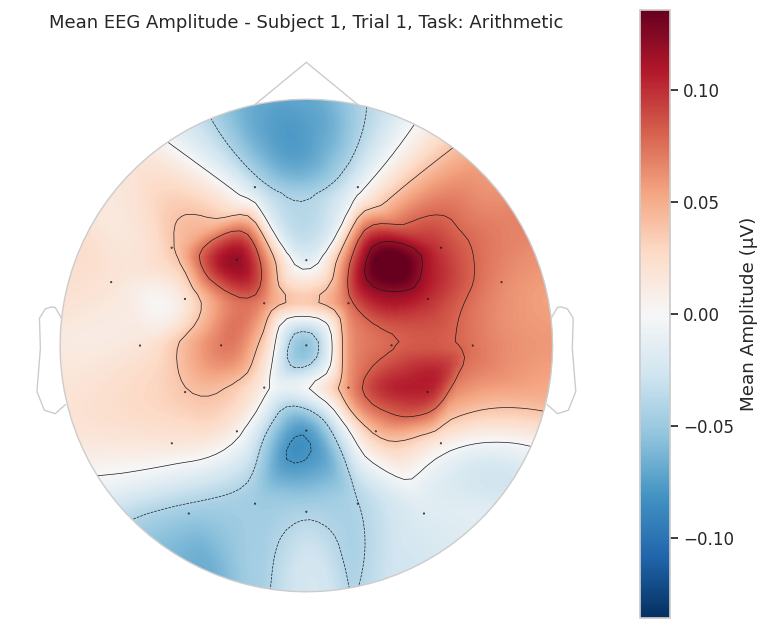


Plotting Alpha band power map...


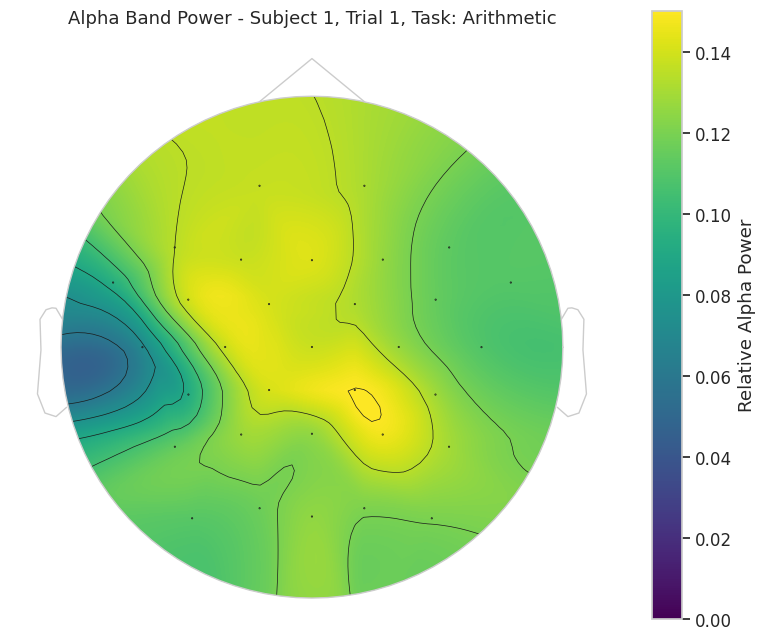


Comparing all frequency bands...


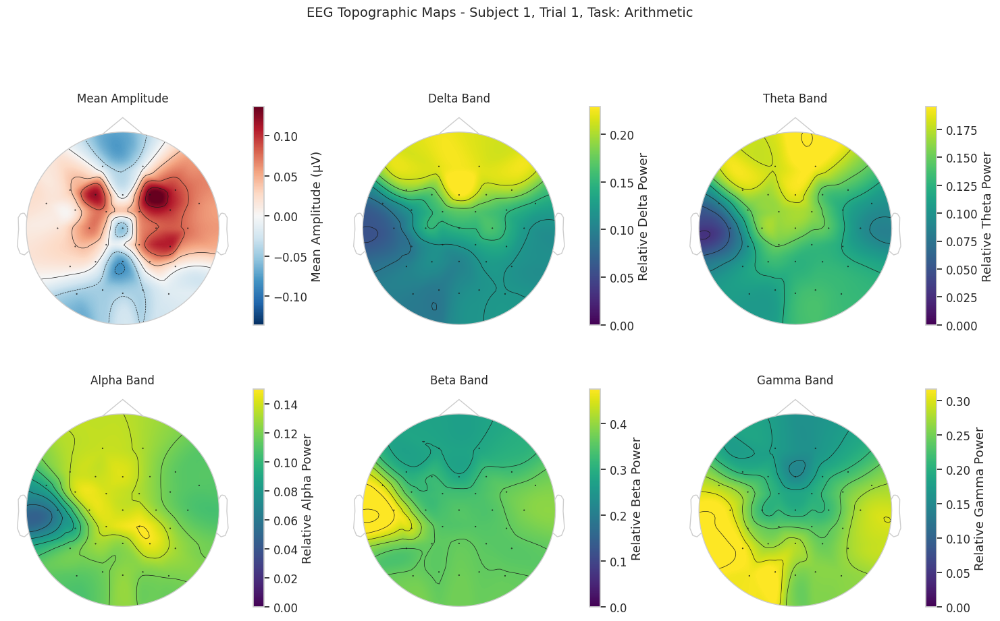

In [13]:
# Simplified Topographic Mapping
import mne
from mne.viz import plot_topomap
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def load_electrode_positions(coords_file):
    """
    Load electrode positions from a coordinates file.
    
    Args:
        coords_file: Path to coordinates file
        
    Returns:
        Dictionary mapping channel names to positions (x, y)
    """
    positions = {}
    try:
        with open(coords_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 4:
                    idx = int(parts[0])
                    angle = float(parts[1])  # in degrees
                    radius = float(parts[2])
                    name = parts[3].strip()
                    
                    # Convert polar coordinates to cartesian
                    angle_rad = np.radians(angle)
                    x = radius * np.sin(angle_rad)
                    y = radius * np.cos(angle_rad)
                    
                    positions[name] = (x, y)
    except Exception as e:
        print(f"Error loading electrode positions: {e}")
    
    return positions

def plot_simple_topomap(eeg_df, subject_id, trial_num, band_power_df=None, band=None):
    """
    Plot a simplified topographic map for EEG data.
    
    Args:
        eeg_df: DataFrame containing EEG data
        subject_id: Subject ID to plot
        trial_num: Trial number to plot
        band_power_df: DataFrame with band power data (optional)
        band: Specific frequency band to plot (if None, plots average amplitude)
    """
    # Filter the dataframe to get the specific trial
    trial_data = eeg_df[(eeg_df['subject_id'] == subject_id) & 
                        (eeg_df['trial_num'] == trial_num)]
    
    if trial_data.empty:
        print(f"No data found for Subject {subject_id}, Trial {trial_num}")
        return
    
    # Get EEG data for this trial
    eeg_data = trial_data.iloc[0]['data']
    task_type = trial_data.iloc[0]['task_type']
    
    # Determine number of channels
    n_channels = eeg_data.shape[0]
    
    # Load electrode positions from the coordinates file
    coords_file = '/home/ankit/Development/EEG Emotion Classification/Data/Coordinates.locs'
    positions = load_electrode_positions(coords_file)
    
    # Define channel names based on available positions
    available_channels = list(positions.keys())
    channel_names = available_channels[:min(n_channels, len(available_channels))]
    
    # Create a layout based on these positions
    pos = np.zeros((len(channel_names), 2))
    for i, ch in enumerate(channel_names):
        if ch in positions:
            pos[i] = positions[ch]
    
    # Normalize positions to ensure they fit within head outline
    max_radius = np.max(np.sqrt(pos[:, 0]**2 + pos[:, 1]**2))
    if max_radius > 0.5:  # If coordinates go beyond typical head boundary
        pos = pos / (max_radius * 1.2)  # Scale down with some margin
    
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Determine what data to plot
    if band is not None and band_power_df is not None:
        # Get band power data for this trial
        trial_bands = band_power_df[(band_power_df['subject_id'] == subject_id) & 
                                  (band_power_df['trial_num'] == trial_num)]
        
        if not trial_bands.empty:
            band_col = f'rel_{band}'
            if band_col in trial_bands.columns:
                # Get data for all channels for this band
                band_values = np.zeros(len(channel_names))
                
                for ch_idx, ch_name in enumerate(channel_names):
                    # Find the channel in the band power data (1-indexed in your data)
                    ch_data = trial_bands[trial_bands['channel'] == ch_idx + 1]
                    if not ch_data.empty and ch_idx < len(band_values):
                        band_values[ch_idx] = ch_data[band_col].values[0]
                
                plot_data = band_values
                title = f'{band} Band Power - Subject {subject_id}, Trial {trial_num}, Task: {task_type}'
                cmap = 'viridis'
                cbar_label = f'Relative {band} Power'
            else:
                print(f"Band {band} not found in data")
                return
        else:
            print(f"No band power data found for Subject {subject_id}, Trial {trial_num}")
            return
    else:
        # Use mean amplitude
        plot_data = np.mean(eeg_data, axis=1)[:len(channel_names)]
        title = f'Mean EEG Amplitude - Subject {subject_id}, Trial {trial_num}, Task: {task_type}'
        cmap = 'RdBu_r'
        cbar_label = 'Mean Amplitude (μV)'
    
    # Plot the topographic map with clear head outline
    im, _ = plot_topomap(
        plot_data, 
        pos, 
        axes=ax,
        show=False, 
        cmap=cmap, 
        sensors=True,  # Show sensor positions
        outlines='head',  # Draw head outline
        contours=6,  # Add contour lines
        sphere=(0, 0, 0, 1),  # Use unit sphere for head model
        image_interp='cubic'  # Smoother interpolation
    )
    
    # Add a colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.8, label=cbar_label)
    
    # Set title and show plot
    ax.set_title(title, fontsize=13)
    plt.tight_layout()
    plt.show()

def compare_bands_topomap(eeg_df, subject_id, trial_num, band_power_df):
    """
    Compare topographic maps for all frequency bands for a single trial.
    
    Args:
        eeg_df: DataFrame containing EEG data
        subject_id: Subject ID to plot
        trial_num: Trial number to plot
        band_power_df: DataFrame with band power data
    """
    # Define frequency bands
    bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
    
    # Filter the dataframe to get the specific trial
    trial_data = eeg_df[(eeg_df['subject_id'] == subject_id) & 
                        (eeg_df['trial_num'] == trial_num)]
    
    if trial_data.empty:
        print(f"No data found for Subject {subject_id}, Trial {trial_num}")
        return
    
    # Get EEG data for this trial
    eeg_data = trial_data.iloc[0]['data']
    task_type = trial_data.iloc[0]['task_type']
    
    # Determine number of channels
    n_channels = eeg_data.shape[0]
    
    # Load electrode positions from the coordinates file
    coords_file = '/home/ankit/Development/EEG Emotion Classification/Data/Coordinates.locs'
    positions = load_electrode_positions(coords_file)
    
    # Define channel names based on available positions
    available_channels = list(positions.keys())
    channel_names = available_channels[:min(n_channels, len(available_channels))]
    
    # Create a layout based on these positions
    pos = np.zeros((len(channel_names), 2))
    for i, ch in enumerate(channel_names):
        if ch in positions:
            pos[i] = positions[ch]
    
    # Normalize positions to ensure they fit within head outline
    max_radius = np.max(np.sqrt(pos[:, 0]**2 + pos[:, 1]**2))
    if max_radius > 0.5:  # If coordinates go beyond typical head boundary
        pos = pos / (max_radius * 1.2)  # Scale down with some margin
    
    # Get band power data for this trial
    trial_bands = band_power_df[(band_power_df['subject_id'] == subject_id) & 
                               (band_power_df['trial_num'] == trial_num)]
    
    if trial_bands.empty:
        print(f"No band power data found for Subject {subject_id}, Trial {trial_num}")
        return
    
    # Create figure with subplots for each band
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    # First plot average amplitude
    mean_data = np.mean(eeg_data, axis=1)[:len(channel_names)]
    im0, _ = plot_topomap(
        mean_data, 
        pos, 
        axes=axes[0],
        show=False, 
        cmap='RdBu_r', 
        sensors=True,
        outlines='head',
        contours=6,
        sphere=(0, 0, 0, 1)
    )
    cbar0 = plt.colorbar(im0, ax=axes[0], shrink=0.7, label='Mean Amplitude (μV)')
    axes[0].set_title('Mean Amplitude', fontsize=12)
    
    # Plot each frequency band
    for i, band in enumerate(bands):
        band_col = f'rel_{band}'
        if band_col in trial_bands.columns:
            # Get data for all channels for this band
            band_values = np.zeros(len(channel_names))
            
            for ch_idx, ch_name in enumerate(channel_names):
                ch_data = trial_bands[trial_bands['channel'] == ch_idx + 1]
                if not ch_data.empty and ch_idx < len(band_values):
                    band_values[ch_idx] = ch_data[band_col].values[0]
            
            # Plot topographic map
            im, _ = plot_topomap(
                band_values, 
                pos, 
                axes=axes[i+1],
                show=False, 
                cmap='viridis', 
                sensors=True,
                outlines='head',
                contours=6,
                sphere=(0, 0, 0, 1)
            )
            cbar = plt.colorbar(im, ax=axes[i+1], shrink=0.7, label=f'Relative {band} Power')
            axes[i+1].set_title(f'{band} Band', fontsize=12)
    
    # Set overall title
    plt.suptitle(f'EEG Topographic Maps - Subject {subject_id}, Trial {trial_num}, Task: {task_type}', 
                fontsize=14)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

# Example usage
if 'eeg_df_sorted' in locals() and 'band_power_df' in locals():
    if not eeg_df_sorted.empty:
        first_subject = eeg_df_sorted['subject_id'].iloc[0]
        first_trial = eeg_df_sorted['trial_num'].iloc[0]
        
        print(f"\nGenerating simplified topographic map for Subject {first_subject}, Trial {first_trial}...")
        plot_simple_topomap(eeg_df_sorted, first_subject, first_trial)
        
        print(f"\nPlotting Alpha band power map...")
        plot_simple_topomap(eeg_df_sorted, first_subject, first_trial, band_power_df, band='Alpha')
        
        print(f"\nComparing all frequency bands...")
        compare_bands_topomap(eeg_df_sorted, first_subject, first_trial, band_power_df)
else:
    print("Required data frames (eeg_df_sorted or band_power_df) not found.")

## Feature Mapping

In [ ]:
# Feature maps for the FFN with improved spatial features

from scipy.signal import spectrogram
import torch

print("Preparing feature matrices for neural network models...")

# Define feature extraction functions that leverage existing calculated data

def create_ffn_feature_matrix(eeg_df, stats_df, band_power_df, topo_features=None):
    """
    Creates a tabular feature matrix for Feed-Forward Neural Networks 
    using the already calculated time and frequency domain features.
    
    Args:
        eeg_df: DataFrame with the raw EEG data
        stats_df: DataFrame with time domain statistics (from statistical measures cell)
        band_power_df: DataFrame with frequency band powers (from frequency domain cell)
        topo_features: Dictionary with topographic features (optional)
        
    Returns:
        DataFrame with features structured for FFN input
    """
    # Make sure we have data to work with
    if eeg_df.empty or stats_df.empty or band_power_df is None:
        print("One or more required dataframes are empty. Cannot create feature matrix.")
        return None
    
    # Get unique trials
    trials = stats_df[['subject_id', 'trial_num', 'task_type']].drop_duplicates()
    
    all_features = []
    
    for _, trial in trials.iterrows():
        subject_id = trial['subject_id']
        trial_num = trial['trial_num']
        task_type = trial['task_type']
        
        # Extract time domain features for this trial
        time_features = stats_df[
            (stats_df['subject_id'] == subject_id) & 
            (stats_df['trial_num'] == trial_num)
        ]
        
        # Extract frequency domain features for this trial
        freq_features = None
        if band_power_df is not None:
            freq_features = band_power_df[
                (band_power_df['subject_id'] == subject_id) & 
                (band_power_df['trial_num'] == trial_num)
            ]
        
        # Skip if we don't have both time and frequency features
        if time_features.empty or (freq_features is None or freq_features.empty):
            continue
        
        # Initialize a feature dictionary for this trial
        trial_features = {
            'subject_id': subject_id,
            'trial_num': trial_num,
            'task_type': task_type
        }
        
        # 1. TIME DOMAIN FEATURES
        # Calculate per-channel statistics and aggregated statistics across channels
        time_cols = ['mean', 'std_dev', 'skewness', 'kurtosis']
        
        # Add channel-specific time domain features
        for channel in time_features['channel'].unique():
            channel_stats = time_features[time_features['channel'] == channel]
            for col in time_cols:
                if col in channel_stats.columns:
                    trial_features[f'{col}_ch{channel}'] = channel_stats[col].values[0]
        
        # Add global statistics (mean, min, max, std) across channels
        for col in time_cols:
            if col in time_features.columns:
                trial_features[f'avg_{col}'] = time_features[col].mean()
                trial_features[f'std_{col}'] = time_features[col].std()
                trial_features[f'min_{col}'] = time_features[col].min() 
                trial_features[f'max_{col}'] = time_features[col].max()
        
        # 2. FREQUENCY DOMAIN FEATURES
        # Add band power features for each channel
        if freq_features is not None:
            rel_cols = [col for col in freq_features.columns if col.startswith('rel_')]
            
            # Add channel-specific frequency features
            for channel in freq_features['channel'].unique():
                channel_freq = freq_features[freq_features['channel'] == channel]
                for col in rel_cols:
                    if col in channel_freq.columns:
                        trial_features[f'{col}_ch{channel}'] = channel_freq[col].values[0]
            
            # Add global statistics for band powers
            for col in rel_cols:
                if col in freq_features.columns:
                    trial_features[f'avg_{col}'] = freq_features[col].mean()
                    trial_features[f'std_{col}'] = freq_features[col].std()
                    
            # Calculate band power ratios (valuable for emotion classification)
            if 'rel_Alpha' in rel_cols and 'rel_Beta' in rel_cols:
                alpha_avg = freq_features['rel_Alpha'].mean()
                beta_avg = freq_features['rel_Beta'].mean()
                if beta_avg > 0:  # Avoid division by zero
                    trial_features['alpha_beta_ratio'] = alpha_avg / beta_avg
            
            if 'rel_Theta' in rel_cols and 'rel_Beta' in rel_cols:
                theta_avg = freq_features['rel_Theta'].mean()
                if beta_avg > 0:
                    trial_features['theta_beta_ratio'] = theta_avg / beta_avg
        
        # 3. SPATIAL FEATURES - Add asymmetry metrics and topographic information
        # Common asymmetry pairs: Fp1-Fp2, F3-F4, C3-C4, P3-P4, O1-O2, F7-F8, T7-T8, P7-P8
        asymmetry_pairs = [(1, 2), (3, 4), (7, 8), (9, 10), (13, 14), (17, 18)]  # Channel number pairs
        
        for left_ch, right_ch in asymmetry_pairs:
            # Check if both channels exist in the data
            if (freq_features is not None and 
                left_ch in freq_features['channel'].values and 
                right_ch in freq_features['channel'].values):
                
                for band in ['Alpha', 'Beta', 'Theta']:
                    col = f'rel_{band}'
                    if col in freq_features.columns:
                        left_power = freq_features[freq_features['channel'] == left_ch][col].values[0]
                        right_power = freq_features[freq_features['channel'] == right_ch][col].values[0]
                        
                        # Asymmetry index (frontal alpha asymmetry is particularly relevant for emotion)
                        if left_power > 0 and right_power > 0:
                            trial_features[f'asymm_{band}_ch{left_ch}_{right_ch}'] = np.log(right_power / left_power)
        
        # 4. TOPOGRAPHIC DISTRIBUTION FEATURES
        # Add topographic features for each frequency band if available
        if topo_features is not None and (subject_id, trial_num) in topo_features:
            topo_data = topo_features[(subject_id, trial_num)]
            
            # Add frontal alpha asymmetry using topographic data
            if 'alpha_frontal_asymmetry' in topo_data:
                trial_features['topo_alpha_frontal_asymm'] = topo_data['alpha_frontal_asymmetry']
            
            # Add region-based features from topographic analysis
            regions = ['frontal', 'central', 'temporal', 'parietal', 'occipital']
            bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
            
            for band in bands:
                for region in regions:
                    key = f'{band.lower()}_{region}'
                    if key in topo_data:
                        trial_features[f'topo_{key}'] = topo_data[key]
            
            # Add global topographic spread metrics if available
            if 'alpha_spread' in topo_data:
                trial_features['topo_alpha_spread'] = topo_data['alpha_spread']
            if 'beta_spread' in topo_data:
                trial_features['topo_beta_spread'] = topo_data['beta_spread']
        
        all_features.append(trial_features)
    
    # Convert to DataFrame
    ffn_features_df = pd.DataFrame(all_features)
    
    # Handle missing values - replace NaNs with 0
    ffn_features_df = ffn_features_df.fillna(0)
    
    return ffn_features_df

def extract_topographic_features(eeg_df, band_power_df):
    """
    Extract topographic features from the EEG data and band power data.
    These features capture the spatial distribution of brain activity.
    
    Args:
        eeg_df: DataFrame with the raw EEG data
        band_power_df: DataFrame with frequency band powers
        
    Returns:
        Dictionary with topographic features for each trial
    """
    # Load electrode positions
    coords_file = '/home/ankit/Development/EEG Emotion Classification/Data/Coordinates.locs'
    positions = {}
    
    try:
        with open(coords_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 4:
                    idx = int(parts[0])
                    angle = float(parts[1])
                    radius = float(parts[2])
                    name = parts[3].strip()
                    
                    # Convert polar coordinates to cartesian
                    angle_rad = np.radians(angle)
                    x = radius * np.sin(angle_rad)
                    y = radius * np.cos(angle_rad)
                    
                    positions[name] = (x, y, idx)
    except Exception as e:
        print(f"Error loading electrode positions: {e}")
        return {}
    
    # Define regions based on electrode positions
    regions = {
        'frontal': ['Fp1', 'Fp2', 'F3', 'F4', 'F7', 'F8', 'Fz'],
        'central': ['C3', 'C4', 'Cz'],
        'temporal': ['T3', 'T4', 'T5', 'T6'],
        'parietal': ['P3', 'P4', 'Pz'],
        'occipital': ['O1', 'O2', 'Oz']
    }
    
    # Convert electrode names to indices
    region_indices = {}
    for region, electrodes in regions.items():
        region_indices[region] = []
        for electrode in electrodes:
            if electrode in positions:
                region_indices[region].append(positions[electrode][2])
    
    topo_features = {}
    
    # Process each trial
    for subject_id in eeg_df['subject_id'].unique():
        for trial_num in eeg_df[eeg_df['subject_id'] == subject_id]['trial_num'].unique():
            # Get band power data for this trial
            trial_bands = band_power_df[
                (band_power_df['subject_id'] == subject_id) & 
                (band_power_df['trial_num'] == trial_num)
            ]
            
            if trial_bands.empty:
                continue
            
            # Initialize features for this trial
            trial_features = {}
            
            # Calculate region-based band powers
            for band in ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']:
                band_col = f'rel_{band}'
                if band_col in trial_bands.columns:
                    for region, indices in region_indices.items():
                        region_powers = []
                        for idx in indices:
                            region_data = trial_bands[trial_bands['channel'] == idx]
                            if not region_data.empty:
                                region_powers.append(region_data[band_col].values[0])
                        
                        if region_powers:
                            # Store average power for this region and band
                            trial_features[f'{band.lower()}_{region}'] = np.mean(region_powers)
            
            # Calculate frontal alpha asymmetry (important for emotion)
            if 'frontal' in region_indices and len(region_indices['frontal']) >= 2:
                left_frontal = [idx for idx in region_indices['frontal'] if idx in [1, 3, 7]]  # Fp1, F3, F7
                right_frontal = [idx for idx in region_indices['frontal'] if idx in [2, 4, 8]]  # Fp2, F4, F8
                
                if left_frontal and right_frontal:
                    left_alpha = []
                    right_alpha = []
                    
                    for idx in left_frontal:
                        left_data = trial_bands[trial_bands['channel'] == idx]
                        if not left_data.empty and 'rel_Alpha' in left_data.columns:
                            left_alpha.append(left_data['rel_Alpha'].values[0])
                    
                    for idx in right_frontal:
                        right_data = trial_bands[trial_bands['channel'] == idx]
                        if not right_data.empty and 'rel_Alpha' in right_data.columns:
                            right_alpha.append(right_data['rel_Alpha'].values[0])
                    
                    if left_alpha and right_alpha:
                        left_avg = np.mean(left_alpha)
                        right_avg = np.mean(right_alpha)
                        if left_avg > 0 and right_avg > 0:
                            # FAA score: ln(Right) - ln(Left)
                            trial_features['alpha_frontal_asymmetry'] = np.log(right_avg) - np.log(left_avg)
            
            # Store features for this trial
            topo_features[(subject_id, trial_num)] = trial_features
    
    return topo_features

def create_cnn_feature_tensors(eeg_df, stats_df=None, band_power_df=None):
    """
    Creates 2D/3D tensors for Convolutional Neural Networks.
    
    Args:
        eeg_df: DataFrame with the raw EEG data
        stats_df: Optional DataFrame with time domain statistics
        band_power_df: Optional DataFrame with frequency band powers
        
    Returns:
        Dictionary with CNN-ready tensors and labels
    """
    if eeg_df.empty:
        print("EEG dataframe is empty. Cannot create CNN feature tensors.")
        return None
    
    time_series_data = []
    spectrograms = []
    band_maps = []
    topo_maps = []  # New: topographic maps
    labels = []
    metadata = []
    
    # Load electrode positions for topographic maps
    coords_file = '/home/ankit/Development/EEG Emotion Classification/Data/Coordinates.locs'
    positions = load_electrode_positions(coords_file)
    
    # Process each trial
    for idx, row in eeg_df.iterrows():
        subject_id = row['subject_id']
        trial_num = row['trial_num']
        task_type = row['task_type']
        eeg_data = row['data']
        
        # Skip if data is invalid
        if eeg_data is None or eeg_data.ndim != 2 or eeg_data.size == 0:
            continue
            
        n_channels, n_timepoints = eeg_data.shape
        
        # 1. Time Series Representation (standardized length)
        max_length = 1000  # Standardized length for all trials
        
        # Either truncate or pad with zeros to standardize length
        if n_timepoints > max_length:
            standardized_eeg = eeg_data[:, :max_length]
        else:
            standardized_eeg = np.zeros((n_channels, max_length))
            standardized_eeg[:, :n_timepoints] = eeg_data
        
        # Z-score normalize each channel
        for ch_idx in range(n_channels):
            channel_data = standardized_eeg[ch_idx, :]
            channel_std = np.std(channel_data)
            if channel_std > 0:  # Avoid division by zero
                standardized_eeg[ch_idx, :] = (channel_data - np.mean(channel_data)) / channel_std
        
        # 2. Spectrogram Representation (time-frequency maps)
        # Compute spectrograms for a subset of channels to save memory
        channels_to_use = min(8, n_channels)  # Use up to 8 channels for spectrograms
        trial_spectrograms = []
        
        for ch_idx in range(channels_to_use):
            channel_data = eeg_data[ch_idx, :]
            
            try:
                # Calculate spectrogram
                f, t, Sxx = spectrogram(
                    channel_data,
                    fs=FS,  # Using the global sampling rate you defined
                    nperseg=min(256, n_timepoints // 4),  # Adjust window size based on data length
                    noverlap=128,
                    scaling='density'
                )
                
                # Log scale for better visualization of power
                log_spec = np.log1p(Sxx)  # log(1+x) to handle zeros
                
                # Resize to standard dimensions if needed
                target_freq = 32
                target_time = 32
                
                # Simple resizing by cropping/padding
                resized_spec = np.zeros((target_freq, target_time))
                
                # Copy what fits
                freq_to_use = min(target_freq, log_spec.shape[0])
                time_to_use = min(target_time, log_spec.shape[1])
                resized_spec[:freq_to_use, :time_to_use] = log_spec[:freq_to_use, :time_to_use]
                
                trial_spectrograms.append(resized_spec)
                
            except Exception as e:
                # If spectrogram calculation fails, use zeros
                print(f"Error in spectrogram calculation: {e}")
                trial_spectrograms.append(np.zeros((32, 32)))
        
        # Stack spectrograms for all channels
        if trial_spectrograms:
            stacked_specs = np.stack(trial_spectrograms)
        else:
            stacked_specs = np.zeros((channels_to_use, 32, 32))
        
        # 3. Band Power Maps (for CNN spatial processing)
        # Use calculated band powers if available, otherwise compute them
        band_power_map = np.zeros((len(FREQ_BANDS), n_channels))
        
        # Check if we have pre-calculated band powers
        if band_power_df is not None:
            trial_bands = band_power_df[
                (band_power_df['subject_id'] == subject_id) & 
                (band_power_df['trial_num'] == trial_num)
            ]
            
            if not trial_bands.empty:
                for band_idx, band in enumerate(FREQ_BANDS.keys()):
                    band_col = f'rel_{band}'
                    if band_col in trial_bands.columns:
                        for ch_idx in range(n_channels):
                            ch_data = trial_bands[trial_bands['channel'] == ch_idx + 1]
                            if not ch_data.empty:
                                band_power_map[band_idx, ch_idx] = ch_data[band_col].values[0]
                
                # 4. Topographic Maps
                # Create a standardized grid for topographic interpolation
                topo_grid_size = 32  # Standard size for CNN input
                topo_map = np.zeros((len(FREQ_BANDS), topo_grid_size, topo_grid_size))
                
                # Create a list of channel positions and values for each band
                for band_idx, band in enumerate(FREQ_BANDS.keys()):
                    band_col = f'rel_{band}'
                    if band_col in trial_bands.columns:
                        # Extract channel values and positions
                        pos = []
                        values = []
                        
                        for ch_idx in range(min(n_channels, len(positions))):
                            ch_data = trial_bands[trial_bands['channel'] == ch_idx + 1]
                            if not ch_data.empty and ch_idx < len(positions):
                                ch_name = list(positions.keys())[ch_idx]
                                if ch_name in positions:
                                    x, y = positions[ch_name]
                                    # Scale to grid coordinates
                                    grid_x = int((x + 1) * topo_grid_size / 2)
                                    grid_y = int((y + 1) * topo_grid_size / 2)
                                    
                                    # Keep coordinates within bounds
                                    grid_x = max(0, min(grid_x, topo_grid_size-1))
                                    grid_y = max(0, min(grid_y, topo_grid_size-1))
                                    
                                    pos.append((grid_y, grid_x))  # Note: y, x order for grid indexing
                                    values.append(ch_data[band_col].values[0])
                        
                        # Simple nearest-neighbor interpolation onto the grid
                        if pos and values:
                            for (y, x), val in zip(pos, values):
                                # Place values at their corresponding positions
                                topo_map[band_idx, y, x] = val
                                
                                # Simple spreading to nearby points (naive interpolation)
                                for dy in [-1, 0, 1]:
                                    for dx in [-1, 0, 1]:
                                        ny, nx = y + dy, x + dx
                                        if 0 <= ny < topo_grid_size and 0 <= nx < topo_grid_size:
                                            # Apply a distance-based weight
                                            dist = np.sqrt(dy**2 + dx**2)
                                            weight = 1 / (1 + dist) if dist > 0 else 1
                                            if topo_map[band_idx, ny, nx] == 0:  # Only fill empty spots
                                                topo_map[band_idx, ny, nx] = val * weight
                
                # Append the topographic map
                topo_maps.append(topo_map)
        
        # Store the processed data
        time_series_data.append(standardized_eeg)
        spectrograms.append(stacked_specs)
        band_maps.append(band_power_map)
        labels.append(task_type)
        metadata.append({'subject_id': subject_id, 'trial_num': trial_num})
    
    # Convert lists to numpy arrays
    X_time = np.array(time_series_data)
    X_spec = np.array(spectrograms)
    X_bands = np.array(band_maps)
    X_topo = np.array(topo_maps) if topo_maps else np.array([])
    y = np.array(labels)
    
    # Convert to PyTorch tensors
    X_time_tensor = torch.FloatTensor(X_time)
    X_spec_tensor = torch.FloatTensor(X_spec)
    X_bands_tensor = torch.FloatTensor(X_bands)
    X_topo_tensor = torch.FloatTensor(X_topo) if len(X_topo) > 0 else None
    
    # Create one-hot encoded labels
    unique_labels = np.unique(y)
    label_map = {label: i for i, label in enumerate(unique_labels)}
    y_numeric = np.array([label_map[label] for label in y])
    y_tensor = torch.LongTensor(y_numeric)
    
    # Create metadata dataframe
    meta_df = pd.DataFrame(metadata)
    
    return {
        'time_series': X_time_tensor,
        'spectrograms': X_spec_tensor,
        'band_maps': X_bands_tensor,
        'topographic_maps': X_topo_tensor,
        'labels': y_tensor,
        'label_map': label_map,
        'metadata': meta_df
    }

# Helper function needed by create_cnn_feature_tensors
def load_electrode_positions(coords_file):
    """
    Load electrode positions from a coordinates file.
    
    Args:
        coords_file: Path to coordinates file
        
    Returns:
        Dictionary mapping channel names to positions (x, y)
    """
    positions = {}
    try:
        with open(coords_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 4:
                    idx = int(parts[0])
                    angle = float(parts[1])  # in degrees
                    radius = float(parts[2])
                    name = parts[3].strip()
                    
                    # Convert polar coordinates to cartesian
                    angle_rad = np.radians(angle)
                    x = radius * np.sin(angle_rad)
                    y = radius * np.cos(angle_rad)
                    
                    positions[name] = (x, y)
    except Exception as e:
        print(f"Error loading electrode positions: {e}")
    
    return positions

print("Creating feature matrices with topographic information...")
# Extract topographic features for FFN
topo_features = extract_topographic_features(eeg_df_sorted, band_power_df)
print(f"Extracted topographic features for {len(topo_features)} trials")

Preparing feature matrices for neural network models...
Creating feature matrices with topographic information...
Extracted topographic features for 160 trials


In [15]:
# Create FFN features from existing calculated data
ffn_features = create_ffn_feature_matrix(eeg_df_sorted, stats_df, band_power_df)

if ffn_features is not None:
    print(f"FFN feature matrix created with shape: {ffn_features.shape}")
    print(f"FFN features include {ffn_features.shape[1]-3} features (excluding subject_id, trial_num, task_type)")
    
    # Display sample of features
    print("\nSample FFN features:")
    display(ffn_features.head(3))
    
    # Save features if needed
    # ffn_features.to_csv('ffn_features.csv', index=False)
else:
    print("Failed to create FFN features.")

# Create CNN features
cnn_features = create_cnn_feature_tensors(eeg_df_sorted, stats_df, band_power_df)

if cnn_features is not None:
    print("\nCNN feature tensors created:")
    print(f"Time series tensor shape: {cnn_features['time_series'].shape}")
    print(f"Spectrogram tensor shape: {cnn_features['spectrograms'].shape}")
    print(f"Band map tensor shape: {cnn_features['band_maps'].shape}")
    print(f"Labels shape: {cnn_features['labels'].shape}")
    print(f"Number of unique classes: {len(cnn_features['label_map'])}")
    
    # Print class mapping
    print("\nClass mapping:")
    for class_name, class_idx in cnn_features['label_map'].items():
        print(f"  {class_name} → {class_idx}")
else:
    print("Failed to create CNN features.")

# Feature Importance Analysis for FFN features
if ffn_features is not None:
    print("\nAnalyzing feature importance...")
    
    # Get feature columns (excluding metadata and target)
    feature_cols = [col for col in ffn_features.columns 
                   if col not in ['subject_id', 'trial_num', 'task_type']]
    
    # Calculate correlation with task type (if task_type is numeric)
    try:
        # Check if correlation can be calculated
        if isinstance(ffn_features['task_type'].iloc[0], str):
            print("Task type is categorical - cannot calculate direct correlation")
            
            # Group by task_type and show mean of each feature to demonstrate differences
            task_group_means = ffn_features.groupby('task_type')[feature_cols].mean()
            print("\nFeature means by task type (sample):")
            display(task_group_means[task_group_means.columns[:5]])
        else:
            # Calculate correlation
            corr = ffn_features[feature_cols].corrwith(ffn_features['task_type'])
            top_features = corr.abs().sort_values(ascending=False).head(10)
            
            print("\nTop 10 features by correlation with task type:")
            display(top_features)
    except Exception as e:
        print(f"Could not calculate feature correlations: {e}")

FFN feature matrix created with shape: (400, 337)
FFN features include 334 features (excluding subject_id, trial_num, task_type)

Sample FFN features:


,subject_id,trial_num,task_type,mean_ch1,std_dev_ch1,skewness_ch1,kurtosis_ch1,mean_ch2,std_dev_ch2,skewness_ch2,...,asymm_Theta_ch7_8,asymm_Alpha_ch9_10,asymm_Beta_ch9_10,asymm_Theta_ch9_10,asymm_Alpha_ch13_14,asymm_Beta_ch13_14,asymm_Theta_ch13_14,asymm_Alpha_ch17_18,asymm_Beta_ch17_18,asymm_Theta_ch17_18
0,1,1,Arithmetic,-0.056164,6.449796,0.058378,-0.305267,-0.012965,7.172786,0.108844,...,-0.106841,-0.265371,0.070919,-0.311175,-0.120970,-0.003999,-0.196570,-0.009929,0.023428,0.040846
1,1,2,Arithmetic,-0.112920,6.101707,0.013463,-0.287561,-0.057945,7.039699,0.075952,...,-0.079098,-0.232624,0.097996,-0.201011,-0.271430,0.025294,-0.257784,0.113155,-0.034610,0.030953
2,1,3,Arithmetic,-0.070941,6.448172,0.008972,-0.306058,-0.050565,7.520217,0.246854,...,-0.157479,-0.104915,0.062010,-0.084920,-0.143951,0.046348,-0.017970,0.048298,-0.003651,0.022101



CNN feature tensors created:
Time series tensor shape: torch.Size([480, 32, 1000])
Spectrogram tensor shape: torch.Size([480, 8, 32, 32])
Band map tensor shape: torch.Size([480, 5, 32])
Labels shape: torch.Size([480])
Number of unique classes: 4

Class mapping:
  Arithmetic → 0
  Mirror → 1
  Relax → 2
  Stroop → 3

Analyzing feature importance...
Task type is categorical - cannot calculate direct correlation

Feature means by task type (sample):


,mean_ch1,std_dev_ch1,skewness_ch1,kurtosis_ch1,mean_ch2
task_type,,,,,
Arithmetic,-0.008556,7.458660,0.007831,-0.289233,-0.027600
Mirror,-0.001583,7.537839,0.005217,-0.294323,-0.033721
Relax,-0.008556,7.458660,0.007831,-0.289233,-0.027600
Stroop,-0.008556,7.458660,0.007831,-0.289233,-0.027600


Creating emotion labels using K-means clustering...
Extracting emotion-relevant features from EEG data...
Created 400 emotion feature records with 57 features
Created emotion features for 400 trials

Cluster to emotion mappings:
Cluster 0: happy (Stress level: medium)
  frontal_alpha_asymmetry: -0.0744
  alpha_beta_ratio: 0.3901
  beta_theta_ratio: 2.8224
  frontal_theta: 0.1324
  parietal_alpha: 0.1150
  global_gamma: 0.2747
Cluster 1: relaxed (Stress level: low)
  frontal_alpha_asymmetry: -0.0436
  alpha_beta_ratio: 0.4566
  beta_theta_ratio: 2.2587
  frontal_theta: 0.1662
  parietal_alpha: 0.1370
  global_gamma: 0.2117
Cluster 2: stressed (Stress level: high)
  frontal_alpha_asymmetry: -0.0770
  alpha_beta_ratio: 0.2964
  beta_theta_ratio: 3.7923
  frontal_theta: 0.1018
  parietal_alpha: 0.0908
  global_gamma: 0.3299
Cluster 3: sad (Stress level: high)
  frontal_alpha_asymmetry: -0.1431
  alpha_beta_ratio: 0.7213
  beta_theta_ratio: 2.0789
  frontal_theta: 0.1621
  parietal_alpha: 0

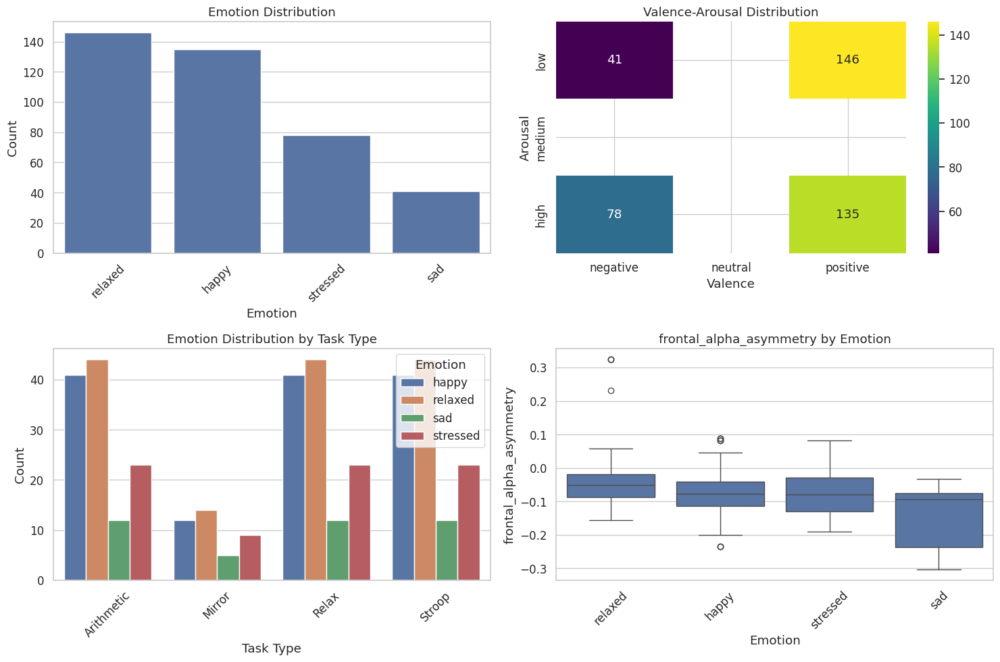

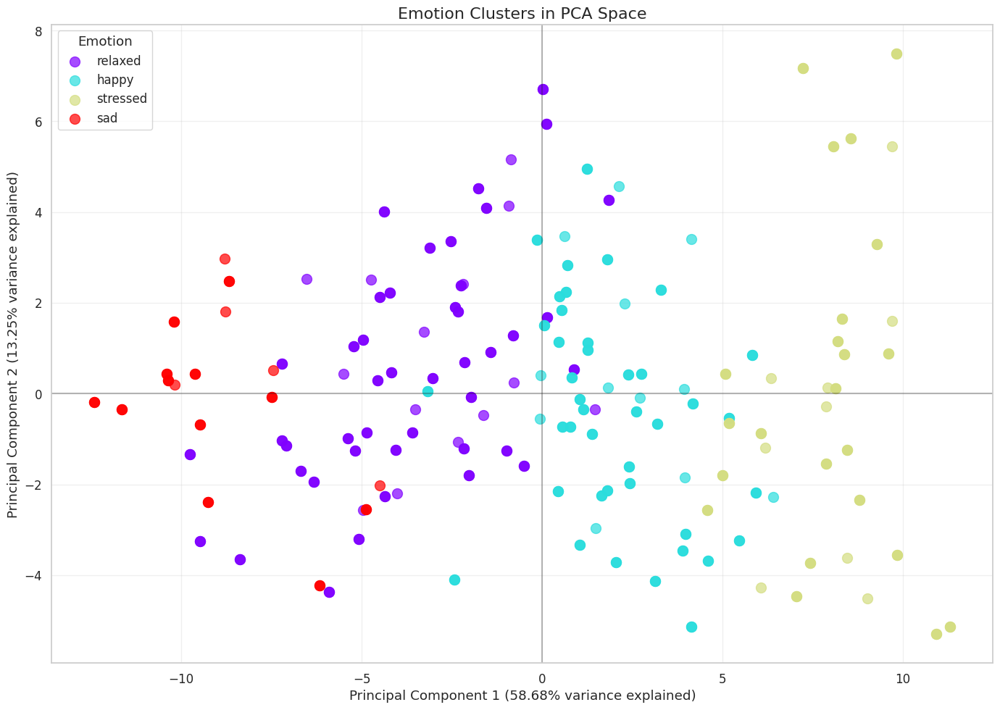

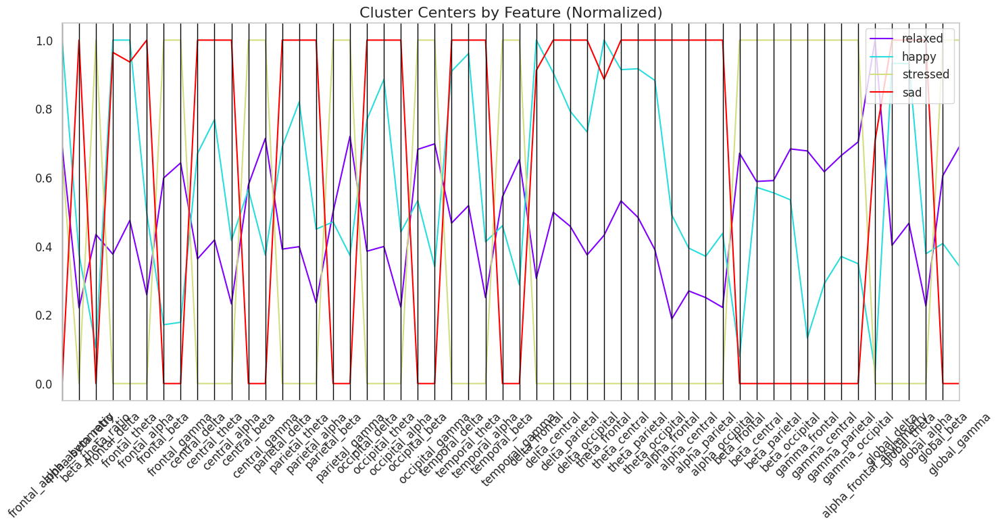


Adding emotion labels to FFN features for model training...
Sample of FFN features with emotion labels:
  subject_id trial_num   task_type  emotion   valence arousal
0          1         1  Arithmetic  relaxed  positive     low
1          1         1  Arithmetic  relaxed  positive     low
2          1         1  Arithmetic  relaxed  positive     low
3          1         2  Arithmetic  relaxed  positive     low
4          1         2  Arithmetic  relaxed  positive     low
Saved FFN features with emotion labels to 'ffn_features_with_emotions.csv'


In [16]:
# Emotion Label Creation using K-means Clustering
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns

print("Creating emotion labels using K-means clustering...")

# Define emotion categories corresponding to valence-arousal space
EMOTION_CATEGORIES = {
    'relaxed': {'valence': 'positive', 'arousal': 'low'},
    'happy': {'valence': 'positive', 'arousal': 'high'},
    'stressed': {'valence': 'negative', 'arousal': 'high'},
    'sad': {'valence': 'negative', 'arousal': 'low'},
    'neutral': {'valence': 'neutral', 'arousal': 'medium'}
}

def cluster_based_emotion_labeling(emotion_features_df, n_clusters=4):
    """
    Generate emotion labels using K-means clustering approach.
    
    Args:
        emotion_features_df: DataFrame with EEG features relevant to emotions
        n_clusters: Number of clusters (emotions) to identify
        
    Returns:
        DataFrame with emotion and stress level labels added
    """
    if emotion_features_df is None or emotion_features_df.empty:
        print("No emotion features available for clustering")
        return None
    
    result_df = emotion_features_df.copy()
    
    # Select features for clustering
    cluster_features = [
        'frontal_alpha_asymmetry',  # associated with valence (positive/negative affect)
        'alpha_beta_ratio',         # associated with relaxation/calmness
        'beta_theta_ratio',         # associated with arousal/excitement
        'frontal_theta',            # associated with cognitive effort/concentration
        'parietal_alpha',           # associated with relaxation
        'global_gamma'              # associated with high arousal
    ]
    
    # Filter to features that actually exist in the dataframe
    cluster_features = [f for f in cluster_features if f in result_df.columns]
    
    if not cluster_features:
        print("No valid features found for clustering")
        return result_df
    
    # Handle missing values
    X = result_df[cluster_features].fillna(0)
    
    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    result_df['cluster'] = kmeans.fit_predict(X_scaled)
    
    # Extract cluster centers for analysis and mapping
    centers = pd.DataFrame(
        scaler.inverse_transform(kmeans.cluster_centers_),
        columns=cluster_features
    )
    
    # Map clusters to emotions and stress levels based on feature patterns
    cluster_mappings = {}
    
    # Calculate relative metrics for ranking
    centers['valence_rank'] = centers['frontal_alpha_asymmetry'].rank(method='dense')
    centers['relaxation_rank'] = centers['alpha_beta_ratio'].rank(method='dense')
    centers['arousal_rank'] = centers['beta_theta_ratio'].rank(method='dense')
    
    # Create emotion mappings based on psychological theory
    # - High valence + High arousal = Happy
    # - Low valence + High arousal = Stressed
    # - High valence + Low arousal = Relaxed
    # - Medium valence + Medium arousal = Neutral
    
    # Identify which cluster is which emotion
    happy_cluster = centers[['valence_rank', 'arousal_rank']].sum(axis=1).idxmax()
    relaxed_cluster = centers[['valence_rank', 'relaxation_rank']].sum(axis=1).idxmax()
    stressed_cluster = centers[centers['arousal_rank'] == centers['arousal_rank'].max()].index[0]
    if stressed_cluster == happy_cluster:  # Avoid duplicate assignment
        stressed_cluster = centers[(centers['arousal_rank'] > centers['arousal_rank'].median()) & 
                                 (centers['valence_rank'] <= centers['valence_rank'].median())].index[0]
    
    # The remaining cluster is sad
    all_clusters = set(range(n_clusters))
    assigned_clusters = {happy_cluster, relaxed_cluster, stressed_cluster}
    sad_cluster = list(all_clusters - assigned_clusters)[0]
    
    # Assign mappings with stress levels
    cluster_mappings[happy_cluster] = {'emotion': 'happy', 'stress_level': 'medium'}
    cluster_mappings[relaxed_cluster] = {'emotion': 'relaxed', 'stress_level': 'low'}
    cluster_mappings[stressed_cluster] = {'emotion': 'stressed', 'stress_level': 'high'}
    cluster_mappings[sad_cluster] = {'emotion': 'sad', 'stress_level': 'high'}
    
    # Display the mapping of clusters to emotions
    print("\nCluster to emotion mappings:")
    for cluster, mapping in cluster_mappings.items():
        print(f"Cluster {cluster}: {mapping['emotion']} (Stress level: {mapping['stress_level']})")
        for feature in cluster_features:
            print(f"  {feature}: {centers.iloc[cluster][feature]:.4f}")
    
    # Apply mappings to the dataset
    result_df['emotion'] = result_df['cluster'].map(lambda x: cluster_mappings[x]['emotion'])
    result_df['stress_level'] = result_df['cluster'].map(lambda x: cluster_mappings[x]['stress_level'])
    
    # Add numerical stress level for analysis
    stress_level_map = {'low': 1, 'medium': 2, 'high': 3}
    result_df['stress_level_numeric'] = result_df['stress_level'].map(stress_level_map)
    
    # Calculate the distribution of emotions and stress levels
    emotion_counts = result_df['emotion'].value_counts()
    stress_counts = result_df['stress_level'].value_counts()
    
    print("\nEmotion distribution after clustering:")
    for emotion, count in emotion_counts.items():
        percentage = (count / len(result_df)) * 100
        print(f"{emotion}: {count} samples ({percentage:.1f}%)")
    
    print("\nStress level distribution after clustering:")
    for level, count in stress_counts.items():
        percentage = (count / len(result_df)) * 100
        print(f"{level}: {count} samples ({percentage:.1f}%)")
    
    # Add valence and arousal categories based on emotion mappings
    result_df['valence'] = result_df['emotion'].map(
        {name: props['valence'] for name, props in EMOTION_CATEGORIES.items()}
    )
    result_df['arousal'] = result_df['emotion'].map(
        {name: props['arousal'] for name, props in EMOTION_CATEGORIES.items()}
    )
    
    return result_df

def visualize_emotion_clusters(emotion_df):
    """
    Create a visualization of the emotion clusters
    
    Args:
        emotion_df: DataFrame with emotion labels and clustering features
    """
    if 'emotion' not in emotion_df.columns or 'cluster' not in emotion_df.columns:
        print("No emotion clusters found in DataFrame")
        return
    
    # Select numerical features for visualization
    numerical_cols = [col for col in emotion_df.columns if col not in 
                     ['subject_id', 'trial_num', 'task_type', 'emotion', 
                      'valence', 'arousal', 'cluster', 'stress_level',
                      'stress_level_numeric']]
    
    if len(numerical_cols) < 2:
        print("Not enough numerical features for visualization")
        return
    
    # Standardize features
    X = StandardScaler().fit_transform(emotion_df[numerical_cols])
    
    # Use PCA to reduce to 2 dimensions
    from sklearn.decomposition import PCA
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)
    
    # Create a DataFrame for plotting
    plot_df = pd.DataFrame({
        'PCA1': X_pca[:, 0],
        'PCA2': X_pca[:, 1],
        'emotion': emotion_df['emotion'],
        'cluster': emotion_df['cluster']
    })
    
    # Create a scatterplot colored by emotion
    plt.figure(figsize=(14, 10))
    
    # Get unique emotions and create a color map
    emotions = plot_df['emotion'].unique()
    colors = plt.cm.rainbow(np.linspace(0, 1, len(emotions)))
    emotion_colors = {emotion: colors[i] for i, emotion in enumerate(emotions)}
    
    # Create a scatter plot
    for emotion in emotions:
        subset = plot_df[plot_df['emotion'] == emotion]
        plt.scatter(subset['PCA1'], subset['PCA2'], 
                   label=emotion, 
                   color=emotion_colors[emotion],
                   alpha=0.7,
                   s=100)
    
    # Add feature vectors
    if len(numerical_cols) <= 10:  # Only show vectors if we have a reasonable number
        pca_components = pca.components_
        feature_vectors = [
            (numerical_cols[i], pca_components[0, i], pca_components[1, i]) 
            for i in range(len(numerical_cols))
        ]
        
        # Scale the vectors for visualization
        scale = 5
        for feature, x, y in feature_vectors:
            plt.arrow(0, 0, x*scale, y*scale, head_width=0.2, head_length=0.2, fc='k', ec='k', alpha=0.5)
            plt.text(x*scale*1.1, y*scale*1.1, feature, fontsize=9)
    
    plt.title('Emotion Clusters in PCA Space', fontsize=16)
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance explained)')
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance explained)')
    plt.axhline(y=0, color='k', linestyle='-', alpha=0.3)
    plt.axvline(x=0, color='k', linestyle='-', alpha=0.3)
    plt.grid(alpha=0.3)
    plt.legend(title='Emotion', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    # Create a detailed visualization showing cluster centers
    plt.figure(figsize=(15, 8))
    
    # Create a parallel coordinates plot to show cluster centers
    # First, create a DataFrame with the cluster centers
    centers_df = emotion_df.groupby('cluster')[numerical_cols].mean().reset_index()
    centers_df['emotion'] = centers_df['cluster'].map(
        {i: emotion for i, emotion in enumerate(emotions)}
    )
    
    # Normalize the centers for plotting
    centers_norm = centers_df[numerical_cols].copy()
    for col in numerical_cols:
        centers_norm[col] = (centers_norm[col] - centers_norm[col].min()) / (centers_norm[col].max() - centers_norm[col].min())
    
    # Add the emotion column back
    centers_norm['emotion'] = centers_df['emotion']
    
    # Plot
    pd.plotting.parallel_coordinates(centers_norm, 'emotion', colormap='rainbow')
    plt.title('Cluster Centers by Feature (Normalized)', fontsize=16)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def visualize_emotion_distribution(emotion_df):
    """
    Visualize the distribution of emotion labels
    
    Args:
        emotion_df: DataFrame with emotion labels
    """
    if 'emotion' not in emotion_df.columns:
        print("No emotion labels found in DataFrame")
        return
    
    # Plot emotion distribution
    plt.figure(figsize=(15, 10))
    
    # 1. Emotion counts - top left
    plt.subplot(2, 2, 1)
    emotion_counts = emotion_df['emotion'].value_counts()
    sns.barplot(x=emotion_counts.index, y=emotion_counts.values)
    plt.title('Emotion Distribution')
    plt.xlabel('Emotion')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    
    # 2. Valence-Arousal distribution - top right
    if 'valence' in emotion_df.columns and 'arousal' in emotion_df.columns:
        plt.subplot(2, 2, 2)
        
        # Create a categorical plot
        valence_order = ['negative', 'neutral', 'positive']
        arousal_order = ['low', 'medium', 'high']
        
        # Count combinations of valence and arousal
        va_counts = emotion_df.groupby(['valence', 'arousal']).size().reset_index(name='count')
        
        # Create a pivot table
        va_pivot = va_counts.pivot(index='arousal', columns='valence', values='count').fillna(0)
        va_pivot = va_pivot.reindex(index=arousal_order, columns=valence_order)
        
        # Plot as a heatmap
        sns.heatmap(va_pivot, annot=True, fmt='g', cmap='viridis')
        plt.title('Valence-Arousal Distribution')
        plt.xlabel('Valence')
        plt.ylabel('Arousal')
    
    # 3. Emotion by Task Type - bottom left
    plt.subplot(2, 2, 3)
    task_emotion = emotion_df.groupby(['task_type', 'emotion']).size().reset_index(name='count')
    sns.barplot(x='task_type', y='count', hue='emotion', data=task_emotion)
    plt.title('Emotion Distribution by Task Type')
    plt.xlabel('Task Type')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Emotion', loc='upper right')
    
    # 4. Feature distribution by emotion - bottom right
    plt.subplot(2, 2, 4)
    
    # Choose a key feature to plot
    feature_choices = ['frontal_alpha_asymmetry', 'alpha_beta_ratio', 'beta_theta_ratio']
    feature_to_plot = next((f for f in feature_choices if f in emotion_df.columns), None)
    
    if feature_to_plot:
        sns.boxplot(x='emotion', y=feature_to_plot, data=emotion_df)
        plt.title(f'{feature_to_plot} by Emotion')
        plt.xlabel('Emotion')
        plt.ylabel(feature_to_plot)
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

def create_emotion_features(band_power_df, topo_features=None):
    """
    Extract emotion-relevant features from band power data and topographic features.
    
    Args:
        band_power_df: DataFrame with frequency band powers
        topo_features: Dictionary with topographic features (optional)
        
    Returns:
        DataFrame with emotion-relevant features
    """
    if band_power_df is None or band_power_df.empty:
        print("Band power data is empty. Cannot create emotion features.")
        return None
    
    # Get unique trials
    subject_trials = band_power_df[['subject_id', 'trial_num', 'task_type']].drop_duplicates()
    
    emotion_features = []
    
    for _, trial in subject_trials.iterrows():
        subject_id = trial['subject_id']
        trial_num = trial['trial_num']
        task_type = trial['task_type']
        
        # Get band power data for this trial
        trial_data = band_power_df[(band_power_df['subject_id'] == subject_id) & 
                                   (band_power_df['trial_num'] == trial_num)]
        
        if trial_data.empty:
            continue
        
        # Initialize feature dictionary
        features = {
            'subject_id': subject_id,
            'trial_num': trial_num,
            'task_type': task_type
        }
        
        # 1. Calculate Frontal Alpha Asymmetry (important for valence)
        # Usually calculated using frontal electrodes (F3/F4, F7/F8)
        frontal_pairs = [(3, 4), (7, 8)]  # Channel pairs for F3/F4, F7/F8
        
        alpha_asym_values = []
        for left_ch, right_ch in frontal_pairs:
            left_data = trial_data[trial_data['channel'] == left_ch]
            right_data = trial_data[trial_data['channel'] == right_ch]
            
            if not left_data.empty and not right_data.empty and 'rel_Alpha' in left_data.columns:
                left_alpha = left_data['rel_Alpha'].values[0]
                right_alpha = right_data['rel_Alpha'].values[0]
                
                if left_alpha > 0 and right_alpha > 0:
                    # FAA = ln(right) - ln(left)
                    alpha_asym = np.log(right_alpha) - np.log(left_alpha)
                    alpha_asym_values.append(alpha_asym)
        
        features['frontal_alpha_asymmetry'] = np.mean(alpha_asym_values) if alpha_asym_values else 0
        
        # 2. Calculate Alpha/Beta Ratio (relaxation indicator)
        alpha_values = trial_data['rel_Alpha'].values if 'rel_Alpha' in trial_data.columns else []
        beta_values = trial_data['rel_Beta'].values if 'rel_Beta' in trial_data.columns else []
        
        if len(alpha_values) > 0 and len(beta_values) > 0:
            mean_alpha = np.mean(alpha_values)
            mean_beta = np.mean(beta_values)
            
            if mean_beta > 0:
                features['alpha_beta_ratio'] = mean_alpha / mean_beta
            else:
                features['alpha_beta_ratio'] = 0
        else:
            features['alpha_beta_ratio'] = 0
        
        # 3. Calculate Beta/Theta Ratio (arousal indicator)
        theta_values = trial_data['rel_Theta'].values if 'rel_Theta' in trial_data.columns else []
        
        if len(beta_values) > 0 and len(theta_values) > 0:
            mean_beta = np.mean(beta_values)
            mean_theta = np.mean(theta_values)
            
            if mean_theta > 0:
                features['beta_theta_ratio'] = mean_beta / mean_theta
            else:
                features['beta_theta_ratio'] = 0
        else:
            features['beta_theta_ratio'] = 0
        
        # 4. Add region-specific band powers
        # Define regions (simplified)
        regions = {
            'frontal': [1, 2, 3, 4, 7, 8],     # Fp1, Fp2, F3, F4, F7, F8
            'central': [9, 10, 11, 12],        # C3, C4, Cz, etc.
            'parietal': [13, 14, 15, 16],      # P3, P4, Pz, etc.
            'occipital': [17, 18, 19, 20],     # O1, O2, etc.
            'temporal': [5, 6, 21, 22]         # T3, T4, T5, T6, etc.
        }
        
        for region, channels in regions.items():
            for band in ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']:
                band_values = []
                
                for ch in channels:
                    ch_data = trial_data[trial_data['channel'] == ch]
                    
                    if not ch_data.empty and f'rel_{band}' in ch_data.columns:
                        band_values.append(ch_data[f'rel_{band}'].values[0])
                
                if band_values:
                    features[f'{region}_{band.lower()}'] = np.mean(band_values)
        
        # 5. Add topographic features if available
        if topo_features is not None and (subject_id, trial_num) in topo_features:
            topo_data = topo_features[(subject_id, trial_num)]
            
            for key, value in topo_data.items():
                features[key] = value
        
        # 6. Add global band powers
        for band in ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']:
            band_col = f'rel_{band}'
            if band_col in trial_data.columns:
                features[f'global_{band.lower()}'] = trial_data[band_col].mean()
        
        # Add to emotion features list
        emotion_features.append(features)
    
    # Convert to DataFrame
    emotion_df = pd.DataFrame(emotion_features)
    
    # Fill missing values
    emotion_df = emotion_df.fillna(0)
    
    print(f"Created {len(emotion_df)} emotion feature records with {len(emotion_df.columns)} features")
    
    return emotion_df
# Usage - Replace your existing emotion labeling code with this
print("Extracting emotion-relevant features from EEG data...")

# Extract emotion features using band power data and topographic features
emotion_features_df = create_emotion_features(band_power_df, topo_features)

if emotion_features_df is not None:
    print(f"Created emotion features for {len(emotion_features_df)} trials")
    
    # Generate emotion labels using K-means clustering approach
    labeled_df_clustering = cluster_based_emotion_labeling(emotion_features_df, n_clusters=4)
    print("\nEmotion labels generated using clustering approach:")
    print(labeled_df_clustering[['subject_id', 'trial_num', 'task_type', 'emotion', 'valence', 'arousal', 'cluster']].head())
    
    # Visualize the results
    print("\nVisualizing emotion distribution after clustering...")
    visualize_emotion_distribution(labeled_df_clustering)
    visualize_emotion_clusters(labeled_df_clustering)
    
    # Add emotion labels to existing FFN features for model training
    if 'ffn_features' in locals() and ffn_features is not None:
        print("\nAdding emotion labels to FFN features for model training...")
        
        # Merge with FFN features
        ffn_with_emotions = ffn_features.merge(
            labeled_df_clustering[['subject_id', 'trial_num', 'emotion', 'valence', 'arousal']],
            on=['subject_id', 'trial_num'],
            how='left'
        )
        
        # Fill any missing values
        ffn_with_emotions['emotion'] = ffn_with_emotions['emotion'].fillna('unknown')
        ffn_with_emotions['valence'] = ffn_with_emotions['valence'].fillna('unknown')
        ffn_with_emotions['arousal'] = ffn_with_emotions['arousal'].fillna('unknown')
        
        print("Sample of FFN features with emotion labels:")
        print(ffn_with_emotions[['subject_id', 'trial_num', 'task_type', 'emotion', 'valence', 'arousal']].head())
        
        # Save the features for model training
        ffn_with_emotions.to_csv('ffn_features_with_emotions.csv', index=False)
        print("Saved FFN features with emotion labels to 'ffn_features_with_emotions.csv'")
else:
    print("Could not create emotion features. Please check your band power data.")

## Neural Networks

In [22]:
# EEG Neural Network Implementation
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import os

# Set seed for reproducibility
RANDOM_SEED = 42
torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

# Configuration
BATCH_SIZE = 32
NUM_EPOCHS = 100
LEARNING_RATE = 0.001
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

class EEGDataset(Dataset):
    """
    Custom Dataset for EEG data loading
    """
    def __init__(self, features, labels):
        """
        Args:
            features: Tensor of input features
            labels: Tensor of target labels
        """
        self.features = features
        self.labels = labels
        
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

def load_dataset(file_path, target_col='emotion', validation_size=0.2, test_path=None):
    """
    Load and preprocess a dataset from a CSV file.
    
    Args:
        file_path: Path to the CSV file containing the dataset
        target_col: Name of the target column
        validation_size: Fraction of data to use for validation
        test_path: Optional path to a test dataset
        
    Returns:
        Dictionary containing data loaders and metadata
    """
    print(f"Loading training data from {file_path}...")
    
    # Check if file exists
    if not os.path.exists(file_path):
        raise FileNotFoundError(f"File not found: {file_path}")
    
    # Load training data
    train_data = pd.read_csv(file_path)
    
    # Check if target column exists
    if target_col not in train_data.columns:
        raise ValueError(f"Target column '{target_col}' not found in data")
    
    # Load test data if provided
    if test_path and os.path.exists(test_path):
        print(f"Loading test data from {test_path}...")
        test_data = pd.read_csv(test_path)
        
        if target_col not in test_data.columns:
            raise ValueError(f"Target column '{target_col}' not found in test data")
    else:
        test_data = None
    
    # Extract metadata and target columns
    metadata_cols = ['subject_id', 'trial_num', 'task_type']
    
    # Extract additional emotion-related columns if they exist
    emotion_cols = [target_col]
    if 'valence' in train_data.columns:
        emotion_cols.append('valence')
    if 'arousal' in train_data.columns:
        emotion_cols.append('arousal')
        
    # All other columns are features
    feature_cols = [col for col in train_data.columns if col not in metadata_cols + emotion_cols]
    
    print(f"Found {len(feature_cols)} feature columns and {len(emotion_cols)} target columns")
    
    # Handle missing values in train data
    if train_data[feature_cols].isnull().sum().sum() > 0:
        print(f"Warning: Found {train_data[feature_cols].isnull().sum().sum()} missing values in train data. Filling with 0.")
        train_data[feature_cols] = train_data[feature_cols].fillna(0)
    
    # Encode labels
    label_encoders = {}
    encoded_labels = {}
    
    for col in emotion_cols:
        le = LabelEncoder()
        encoded_labels[col] = le.fit_transform(train_data[col])
        label_encoders[col] = le
        print(f"Encoded {col} classes: {list(le.classes_)}")
    
    # Standardize features
    scaler = StandardScaler()
    train_features_scaled = scaler.fit_transform(train_data[feature_cols])
    
    # Split training data into train and validation
    X_train, X_val, y_train, y_val = train_test_split(
        train_features_scaled, 
        encoded_labels[target_col],
        test_size=validation_size,
        random_state=RANDOM_SEED
    )
    
    # Prepare test data
    if test_data is not None:
        if test_data[feature_cols].isnull().sum().sum() > 0:
            print(f"Warning: Found {test_data[feature_cols].isnull().sum().sum()} missing values in test data. Filling with 0.")
            test_data[feature_cols] = test_data[feature_cols].fillna(0)
        
        test_features_scaled = scaler.transform(test_data[feature_cols])
        test_encoded_label = label_encoders[target_col].transform(test_data[target_col])
        
        X_test = test_features_scaled
        y_test = test_encoded_label
    else:
        X_test = np.array([])
        y_test = np.array([])
    
    # Convert to tensors
    X_train_tensor = torch.FloatTensor(X_train)
    X_val_tensor = torch.FloatTensor(X_val)
    X_test_tensor = torch.FloatTensor(X_test)
    
    y_train_tensor = torch.LongTensor(y_train)
    y_val_tensor = torch.LongTensor(y_val)
    y_test_tensor = torch.LongTensor(y_test)
    
    # Create dataset objects
    train_dataset = EEGDataset(X_train_tensor, y_train_tensor)
    val_dataset = EEGDataset(X_val_tensor, y_val_tensor)
    test_dataset = EEGDataset(X_test_tensor, y_test_tensor)
    
    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
    
    print(f"Data split: Train={len(train_dataset)}, Validation={len(val_dataset)}, Test={len(test_dataset)}")
    
    return {
        'train_loader': train_loader,
        'val_loader': val_loader,
        'test_loader': test_loader,
        'feature_cols': feature_cols,
        'target_col': target_col,
        'label_encoder': label_encoders[target_col],
        'n_features': len(feature_cols),
        'n_classes': len(label_encoders[target_col].classes_),
        'scaler': scaler,
        'class_names': list(label_encoders[target_col].classes_)
    }

Using device: cpu


In [21]:
class SimpleNN(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, dropout_rate=0.5):
        super(SimpleNN, self).__init__()
        
        layers = []
        
        # Input layer
        layers.append(nn.Linear(input_size, hidden_sizes[0]))
        layers.append(nn.ReLU())
        layers.append(nn.Dropout(dropout_rate))
        
        # Hidden layers
        for i in range(len(hidden_sizes)-1):
            layers.append(nn.Linear(hidden_sizes[i], hidden_sizes[i+1]))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout_rate))
        
        # Output layer
        layers.append(nn.Linear(hidden_sizes[-1], output_size))
        
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.model(x)

In [19]:
class EarlyStopping:
    """
    Early stopping to prevent overfitting
    """
    def __init__(self, patience=7, min_delta=0, verbose=False):
        """
        Args:
            patience: How many epochs to wait before stopping when loss is not improving
            min_delta: Minimum change in monitored value to qualify as improvement
            verbose: If True, prints a message for each improvement
        """
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float('inf')
        
    def __call__(self, val_loss, model, model_path):
        score = -val_loss
        
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model, model_path)
        elif score < self.best_score + self.min_delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model, model_path)
            self.counter = 0
            
    def save_checkpoint(self, val_loss, model, model_path):
        """Save model when validation loss decreases."""
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model...')
        torch.save(model.state_dict(), model_path)
        self.val_loss_min = val_loss


def train_one_epoch(model, train_loader, criterion, optimizer, device):
    """
    Train the model for one epoch
    
    Args:
        model: PyTorch model
        train_loader: Training data loader
        criterion: Loss function
        optimizer: Optimizer
        device: Device to use for training
        
    Returns:
        Average training loss for the epoch
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        
        # Zero the parameter gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        
        # Track statistics
        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    
    return epoch_loss, epoch_acc


def validate(model, val_loader, criterion, device):
    """
    Evaluate the model on the validation set
    
    Args:
        model: PyTorch model
        val_loader: Validation data loader
        criterion: Loss function
        device: Device to use for evaluation
        
    Returns:
        Average validation loss and accuracy
    """
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Track statistics
            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    
    return epoch_loss, epoch_acc


def test_model(model, test_loader, criterion, device, label_encoder=None):
    """
    Test the model on the test set and generate detailed metrics
    
    Args:
        model: PyTorch model
        test_loader: Test data loader
        criterion: Loss function
        device: Device to use for testing
        label_encoder: Label encoder to decode class labels
        
    Returns:
        Dictionary of test metrics
    """
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Track statistics
            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions and labels for additional metrics
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    test_loss = running_loss / total
    test_acc = correct / total
    
    # Calculate additional metrics
    from sklearn.metrics import classification_report, confusion_matrix
    
    # Convert numeric labels to original class names if label_encoder is provided
    if label_encoder is not None:
        class_names = label_encoder.classes_
        all_preds_decoded = label_encoder.inverse_transform(all_preds)
        all_labels_decoded = label_encoder.inverse_transform(all_labels)
    else:
        class_names = [str(i) for i in range(max(max(all_preds), max(all_labels)) + 1)]
        all_preds_decoded = all_preds
        all_labels_decoded = all_labels
    
    # Generate classification report
    report = classification_report(all_labels_decoded, all_preds_decoded, output_dict=True)
    
    # Generate confusion matrix
    conf_matrix = confusion_matrix(all_labels, all_preds)
    
    return {
        'test_loss': test_loss,
        'test_acc': test_acc,
        'classification_report': report,
        'confusion_matrix': conf_matrix,
        'class_names': class_names
    }


def train_model(model, train_loader, val_loader, criterion, optimizer, device, 
                num_epochs=100, model_path='best_model.pth', patience=10, verbose=True):
    """
    Train the model with early stopping
    
    Args:
        model: PyTorch model
        train_loader: Training data loader
        val_loader: Validation data loader
        criterion: Loss function
        optimizer: Optimizer
        device: Device to use for training
        num_epochs: Maximum number of epochs
        model_path: Path to save the best model
        patience: Early stopping patience
        verbose: Whether to print progress
        
    Returns:
        Training history
    """
    # Initialize early stopping
    early_stopping = EarlyStopping(patience=patience, verbose=verbose)

    os.makedirs(os.path.dirname(model_path), exist_ok=True)
    
    # Initialize history
    history = {
        'train_loss': [],
        'train_acc': [],
        'val_loss': [],
        'val_acc': []
    }
    
    # Train the model
    for epoch in range(1, num_epochs + 1):
        # Train
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
        
        # Validate
        val_loss, val_acc = validate(model, val_loader, criterion, device)
        
        # Store history
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        
        # Print progress
        if verbose:
            print(f'Epoch {epoch}/{num_epochs} | '
                  f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | '
                  f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')
        
        # Early stopping
        early_stopping(val_loss, model, model_path)
        if early_stopping.early_stop:
            if verbose:
                print(f'Early stopping at epoch {epoch}')
            break
    
    # Load the best model
    model.load_state_dict(torch.load(model_path))
    
    return history


def plot_training_history(history):
    """
    Plot training history
    
    Args:
        history: Dictionary of training history
    """
    plt.figure(figsize=(12, 5))
    
    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(history['train_loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history['train_acc'], label='Train Accuracy')
    plt.plot(history['val_acc'], label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()


def plot_confusion_matrix(conf_matrix, class_names):
    """
    Plot confusion matrix
    
    Args:
        conf_matrix: Confusion matrix
        class_names: List of class names
    """
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.show()


=== Loading and Processing Data for Feed Forward Network ===
Training on subjects: ['7' '27' '13' '18' '10' '16' '33' '17' '36' '35' '1' '28' '6' '12' '2'
 '31' '22' '3' '32' '38' '4' '37' '24' '34' '11' '23' '19' '21' '8' '15'
 '29' '39']
Testing on subjects: ['25' '14' '9' '26' '5' 'sub' '20' '40' '30']
Loading training data from train_data.csv...
Loading test data from test_data.csv...
Found 334 feature columns and 3 target columns
Encoded emotion classes: ['happy', 'relaxed', 'sad', 'stressed']
Encoded valence classes: ['negative', 'positive']
Encoded arousal classes: ['high', 'low']
Data split: Train=691, Validation=173, Test=256

=== Building and Training Feed Forward Network ===
Epoch 1/100 | Train Loss: 1.1080, Train Acc: 0.5326 | Val Loss: 0.7176, Val Acc: 0.7919
Validation loss decreased (inf --> 0.717628). Saving model...
Epoch 2/100 | Train Loss: 0.5635, Train Acc: 0.7959 | Val Loss: 0.3288, Val Acc: 0.8382
Validation loss decreased (0.717628 --> 0.328797). Saving model...

/tmp/ipykernel_32942/1014005375.py:260: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


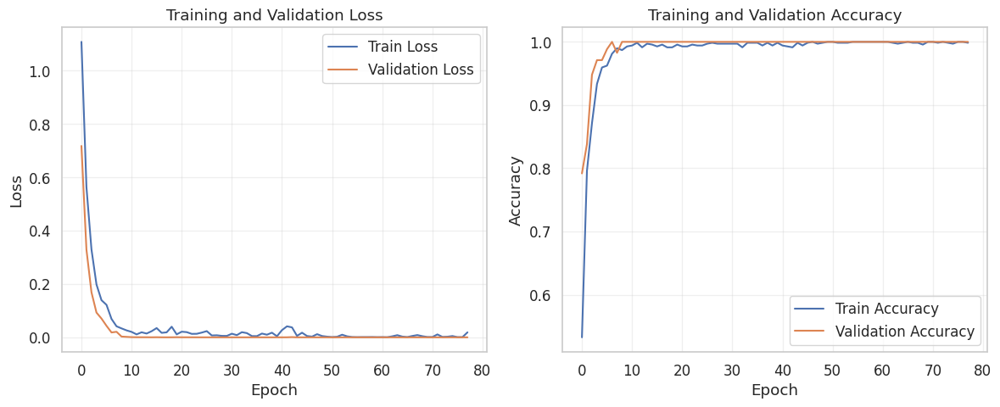


FFN Test Accuracy: 0.7539
FFN Test Loss: 3.8692

FFN Classification Report:
happy: Precision=0.963, Recall=0.510, F1=0.667
relaxed: Precision=0.712, Recall=0.961, F1=0.818
sad: Precision=0.800, Recall=0.286, F1=0.421
stressed: Precision=0.677, Recall=1.000, F1=0.808
macro avg: Precision=0.788, Recall=0.689, F1=0.678
weighted avg: Precision=0.808, Recall=0.754, F1=0.733


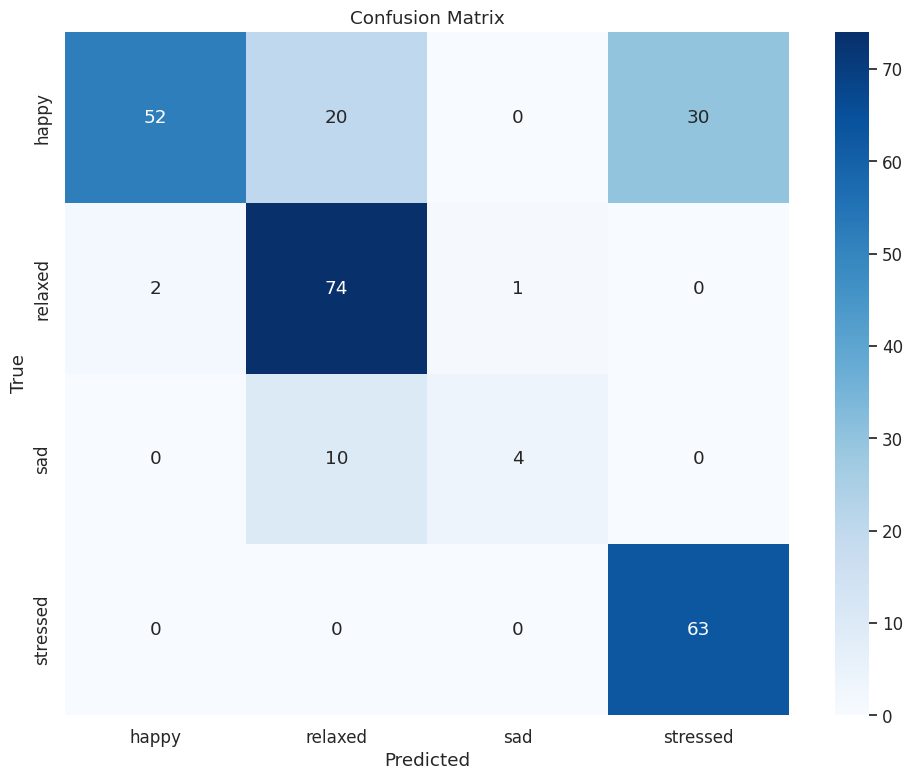

In [24]:
def main():
    """
    Main function to run the complete workflow
    """
    # 1. Load and preprocess data for FFN
    print("\n=== Loading and Processing Data for Feed Forward Network ===")
    data_path = 'ffn_features_with_emotions.csv'
    
    # Load the full dataset
    full_data = pd.read_csv(data_path)
    
    # Get unique subjects
    subjects = full_data['subject_id'].unique()
    
    # Split subjects into train/test to prevent data leakage
    train_subjects, test_subjects = train_test_split(
        subjects, test_size=0.2, random_state=RANDOM_SEED
    )
    
    print(f"Training on subjects: {train_subjects}")
    print(f"Testing on subjects: {test_subjects}")
    
    # Create train and test dataframes
    train_data = full_data[full_data['subject_id'].isin(train_subjects)]
    test_data = full_data[full_data['subject_id'].isin(test_subjects)]
    
    # Save split datasets
    train_data.to_csv('train_data.csv', index=False)
    test_data.to_csv('test_data.csv', index=False)
    
    # Now load properly split data
    ffn_data = load_dataset('train_data.csv', target_col='emotion', test_path='test_data.csv')
    
    # 2. Build and train the FFN model
    print("\n=== Building and Training Feed Forward Network ===")
    # Define model parameters
    input_size = ffn_data['n_features']
    hidden_sizes = [256, 128, 64]
    output_size = ffn_data['n_classes']
    
    # Create model
    ffn_model = SimpleNN(input_size, hidden_sizes, output_size)
    ffn_model.to(DEVICE)
    
    # Define loss function and optimizer
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(ffn_model.parameters(), lr=LEARNING_RATE)
    
    # Train model
    os.makedirs('models', exist_ok=True)
    ffn_history = train_model(
    ffn_model, 
    ffn_data['train_loader'], 
    ffn_data['val_loader'], 
    criterion, 
    optimizer, 
    DEVICE,
    num_epochs=NUM_EPOCHS,
    model_path='models/best_ffn_model.pth',  # Include the 'models/' directory
    patience=15,
    verbose=True
)
    
    # Plot training history
    print("\n=== FFN Training Results ===")
    plot_training_history(ffn_history)
    
    # Test model
    ffn_test_results = test_model(
        ffn_model, 
        ffn_data['test_loader'], 
        criterion, 
        DEVICE,
        ffn_data['label_encoder']
    )
    
    # Print test results
    print(f"\nFFN Test Accuracy: {ffn_test_results['test_acc']:.4f}")
    print(f"FFN Test Loss: {ffn_test_results['test_loss']:.4f}")
    
    # Print classification report 
    print("\nFFN Classification Report:")
    report = ffn_test_results['classification_report']
    for cls, metrics in report.items():
        if isinstance(metrics, dict):
            print(f"{cls}: Precision={metrics['precision']:.3f}, Recall={metrics['recall']:.3f}, F1={metrics['f1-score']:.3f}")
    
    # Plot confusion matrix
    plot_confusion_matrix(
        ffn_test_results['confusion_matrix'],
        ffn_test_results['class_names']
    )

if __name__ == "__main__":
    main()

In [84]:
class EEGCNN(nn.Module):
    def __init__(self, input_shape, num_classes):
        """
        CNN for EEG emotion classification that processes spatial information.
        
        Args:
            input_shape: Tuple of (channels, height, width) for input data
            num_classes: Number of output classes (emotions)
        """
        super(EEGCNN, self).__init__()
        
        # Extract dimensions from input shape
        channels, height, width = input_shape
        
        # Feature extraction layers
        self.features = nn.Sequential(
            # First convolutional block
            nn.Conv2d(channels, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.2),
            
            # Second convolutional block
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.2),
            
            # Third convolutional block
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout(0.2)
        )
        
        # Calculate the size of the flattened features
        # After 3 pooling layers with stride 2, the dimensions are reduced by factor of 2^3 = 8
        # Add safety check to handle different input sizes
        h_out = max(1, height // 8)
        w_out = max(1, width // 8)
        flat_features_size = 128 * h_out * w_out
        
        # Classification layers
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(flat_features_size, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(64, num_classes)
        )
        
    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

In [85]:
def prepare_cnn_data_for_emotions(cnn_features, emotion_labels_df, validation_split=0.2):
    """
    Prepare CNN data for emotion classification.
    
    Args:
        cnn_features: Dictionary containing CNN-ready tensors
        emotion_labels_df: DataFrame with emotion labels
        validation_split: Fraction of data to use for validation
        
    Returns:
        Dictionary containing data loaders and metadata
    """
    # First, select which tensor to use
    if cnn_features['topographic_maps'] is not None:
        input_tensor = cnn_features['topographic_maps']
        print(f"Using topographic maps tensor with shape: {input_tensor.shape}")
    elif cnn_features['band_maps'] is not None:
        # Add height dimension
        input_tensor = cnn_features['band_maps'].unsqueeze(2)
        print(f"Using band maps tensor with shape: {input_tensor.shape}")
    elif cnn_features['spectrograms'] is not None:
        input_tensor = cnn_features['spectrograms']
        print(f"Using spectrograms tensor with shape: {input_tensor.shape}")
    else:
        raise ValueError("No suitable CNN tensor found in the features")
    
    # Get metadata to match with emotion labels
    metadata_df = cnn_features['metadata']
    
    # Match samples with emotion labels
    matched_samples = []
    matched_emotions = []
    emotion_label_map = {}
    
    print("Matching CNN samples with emotion labels...")
    
    # For each sample in the CNN features
    for i in range(len(metadata_df)):
        subject_id = metadata_df.iloc[i]['subject_id']
        trial_num = metadata_df.iloc[i]['trial_num']
        
        # Find corresponding emotion label
        emotion_row = emotion_labels_df[(emotion_labels_df['subject_id'] == subject_id) & 
                                     (emotion_labels_df['trial_num'] == trial_num)]
        
        if not emotion_row.empty:
            emotion = emotion_row['emotion'].values[0]
            matched_samples.append(i)
            matched_emotions.append(emotion)
            
            # Add to label map if not already present
            if emotion not in emotion_label_map:
                emotion_label_map[emotion] = len(emotion_label_map)
    
    print(f"Found {len(matched_samples)} samples with matching emotion labels")
    print(f"Emotion classes: {list(emotion_label_map.keys())}")
    
    # Get the subset of tensors with matching emotion labels
    matched_tensors = input_tensor[matched_samples]
    
    # Convert emotion strings to numeric labels
    numeric_labels = [emotion_label_map[emotion] for emotion in matched_emotions]
    labels_tensor = torch.LongTensor(numeric_labels)
    
    # Check class distribution for imbalance
    unique_labels, counts = torch.unique(labels_tensor, return_counts=True)
    print("\nEmotion class distribution:")
    for label, count in zip(unique_labels, counts):
        emotion = [k for k, v in emotion_label_map.items() if v == label.item()][0]
        print(f"  {emotion}: {count.item()} samples")
    
    # Split data into train and validation sets
    X_train, X_val, y_train, y_val = train_test_split(
        matched_tensors, labels_tensor, 
        test_size=validation_split, 
        random_state=RANDOM_SEED,
        stratify=labels_tensor  # Ensure balanced classes in both sets
    )
    
    # Create datasets
    train_dataset = EEGCNNDataset(X_train, y_train)
    val_dataset = EEGCNNDataset(X_val, y_val)
    
    # Create data loaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=BATCH_SIZE, 
        shuffle=True
    )
    val_loader = DataLoader(
        val_dataset, 
        batch_size=BATCH_SIZE
    )
    
    # Calculate input shape for the CNN
    input_shape = matched_tensors.shape[1:]  # (channels, height, width)
    
    return {
        'train_loader': train_loader,
        'val_loader': val_loader,
        'input_shape': input_shape,
        'n_classes': len(emotion_label_map),
        'emotion_label_map': emotion_label_map
    }

In [87]:
def train_emotion_cnn():
    """
    Train and evaluate a CNN model for emotion classification
    """
    print("\n=== Training CNN Model for Emotion Classification ===")
    
    # Check if CNN features are available
    if 'cnn_features' not in globals() or cnn_features is None:
        print("CNN features not found. Please run the feature extraction cell first.")
        return
    
    # Load emotion labels
    emotion_labels_path = 'ffn_features_with_emotions.csv'
    if not os.path.exists(emotion_labels_path):
        print(f"Emotion labels file not found: {emotion_labels_path}")
        return
    
    emotion_labels_df = pd.read_csv(emotion_labels_path)
    print(f"Loaded emotion labels for {len(emotion_labels_df)} samples")
    
    # Prepare data with emotion labels
    data = prepare_cnn_data_for_emotions(cnn_features, emotion_labels_df)
    
    # Create model
    model = EEGCNN(data['input_shape'], data['n_classes'])
    model.to(DEVICE)
    
    # Print model summary
    print(f"\nCNN Model Architecture:")
    print(model)
    print(f"\nInput shape: {data['input_shape']}")
    print(f"Number of emotion classes: {data['n_classes']}")
    
    # Calculate class weights to handle imbalance
    class_counts = np.bincount([i for i in range(data['n_classes']) 
                              for _ in range(len(data['train_loader'].dataset) // data['n_classes'])])
    class_weights = 1.0 / class_counts
    class_weights = torch.FloatTensor(class_weights / np.sum(class_weights) * data['n_classes']).to(DEVICE)
    
    # Define loss function with class weights and optimizer
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    
    # Train model
    history = train_model(
        model,
        data['train_loader'],
        data['val_loader'],
        criterion,
        optimizer,
        DEVICE,
        num_epochs=NUM_EPOCHS,
        model_path='models/best_emotion_cnn_model.pth',
        patience=15,
        verbose=True
    )
    
    # Plot training history
    print("\n=== CNN Emotion Classification Results ===")
    plot_training_history(history)
    
    # Test model on validation set
    val_results = test_model(
        model,
        data['val_loader'],
        criterion,
        DEVICE
    )
    
    # Print results
    print(f"\nCNN Emotion Validation Accuracy: {val_results['test_acc']:.4f}")
    print(f"CNN Emotion Validation Loss: {val_results['test_loss']:.4f}")
    
    # Convert numeric classes back to emotion labels
    reversed_label_map = {v: k for k, v in data['emotion_label_map'].items()}
    class_names = [reversed_label_map[i] for i in range(data['n_classes'])]
    
    # Plot confusion matrix
    plot_confusion_matrix(
        val_results['confusion_matrix'],
        class_names
    )
    
    return model, history, val_results

In [100]:
def prepare_cnn_data_with_subject_split(cnn_features, emotion_labels_df, test_subjects_ratio=0.2):
    """
    Prepare CNN data with subject-wise split to prevent data leakage.
    
    Args:
        cnn_features: Dictionary containing CNN-ready tensors
        emotion_labels_df: DataFrame with emotion labels
        test_subjects_ratio: Fraction of subjects to use for testing
        
    Returns:
        Dictionary containing data loaders and metadata
    """
    # First, select which tensor to use
    if cnn_features['topographic_maps'] is not None:
        input_tensor = cnn_features['topographic_maps']
        print(f"Using topographic maps tensor with shape: {input_tensor.shape}")
    elif cnn_features['band_maps'] is not None:
        # Add height dimension if it's missing
        if len(cnn_features['band_maps'].shape) == 3:  # [samples, bands, channels]
            input_tensor = cnn_features['band_maps'].unsqueeze(2)  # Add height dimension
        else:
            input_tensor = cnn_features['band_maps']
        print(f"Using band maps tensor with shape: {input_tensor.shape}")
    elif cnn_features['spectrograms'] is not None:
        input_tensor = cnn_features['spectrograms']
        print(f"Using spectrograms tensor with shape: {input_tensor.shape}")
    else:
        raise ValueError("No suitable CNN tensor found in the features")
    
    # Get metadata 
    metadata_df = cnn_features['metadata']
    
    # Print debugging information to understand the data format
    print("\nDEBUGGING INFO:")
    print(f"CNN metadata subject_id type: {metadata_df['subject_id'].dtype}")
    print(f"Emotion labels subject_id type: {emotion_labels_df['subject_id'].dtype}")
    print(f"CNN metadata trial_num type: {metadata_df['trial_num'].dtype}")
    print(f"Emotion labels trial_num type: {emotion_labels_df['trial_num'].dtype}")
    
    # Convert subject_id and trial_num to consistent string format in both datasets
    metadata_df['subject_id'] = metadata_df['subject_id'].astype(str)
    metadata_df['trial_num'] = metadata_df['trial_num'].astype(str)
    emotion_labels_df['subject_id'] = emotion_labels_df['subject_id'].astype(str)
    emotion_labels_df['trial_num'] = emotion_labels_df['trial_num'].astype(str)
    
    # Split subjects into train/test
    all_subjects = emotion_labels_df['subject_id'].unique()
    train_subjects, test_subjects = train_test_split(
        all_subjects, test_size=test_subjects_ratio, random_state=RANDOM_SEED
    )
    
    print(f"Training on subjects: {sorted(train_subjects)}")
    print(f"Testing on subjects: {sorted(test_subjects)}")
    
    # Match samples with emotion labels and filter by subject split
    train_indices = []
    train_emotions = []
    test_indices = []
    test_emotions = []
    emotion_label_map = {}
    
    print("Matching CNN samples with emotion labels and subject split...")
    print(f"Total CNN samples: {len(metadata_df)}")
    print(f"Total emotion samples: {len(emotion_labels_df)}")
    
    # Print some examples from both datasets to diagnose matching issues
    print("\nSample CNN metadata:")
    print(metadata_df[['subject_id', 'trial_num']].head(3))
    
    print("\nSample emotion labels:")
    print(emotion_labels_df[['subject_id', 'trial_num', 'emotion']].head(3))
    
    # Group emotion labels by subject_id and trial_num to make lookup faster
    emotion_lookup = {}
    for _, row in emotion_labels_df.iterrows():
        key = (row['subject_id'], row['trial_num'])
        emotion_lookup[key] = row['emotion']
    
    # For each sample in the CNN features
    match_count = 0
    for i in range(len(metadata_df)):
        subject_id = metadata_df.iloc[i]['subject_id']
        trial_num = metadata_df.iloc[i]['trial_num']
        
        # Try to find emotion for this subject/trial
        lookup_key = (subject_id, trial_num)
        if lookup_key in emotion_lookup:
            match_count += 1
            emotion = emotion_lookup[lookup_key]
            
            # Add to label map if not already present
            if emotion not in emotion_label_map:
                emotion_label_map[emotion] = len(emotion_label_map)
            
            # Add to appropriate split based on subject
            if subject_id in train_subjects:
                train_indices.append(i)
                train_emotions.append(emotion)
            else:
                test_indices.append(i)
                test_emotions.append(emotion)
    
    print(f"Matched {match_count} out of {len(metadata_df)} CNN samples with emotion labels")
    print(f"Found {len(train_indices)} training samples and {len(test_indices)} test samples")
    
    # Check if we have enough data
    if len(train_indices) == 0 or len(test_indices) == 0:
        print("ERROR: Not enough matching samples found. Check your data alignment.")
        
        # Try a more flexible matching approach as a fallback
        print("\nTrying alternative matching approach...")
        
        # Reset data
        train_indices = []
        train_emotions = []
        test_indices = []
        test_emotions = []
        emotion_label_map = {}
        match_count = 0
        
        # Map samples by subject without requiring trial match
        subject_emotions = {}
        for subject_id in all_subjects:
            subject_emotions[subject_id] = emotion_labels_df[emotion_labels_df['subject_id'] == subject_id]['emotion'].iloc[0]
        
        # For each sample in the CNN features
        for i in range(len(metadata_df)):
            subject_id = metadata_df.iloc[i]['subject_id']
            
            # Try to find emotion for this subject
            if subject_id in subject_emotions:
                match_count += 1
                emotion = subject_emotions[subject_id]
                
                # Add to label map if not already present
                if emotion not in emotion_label_map:
                    emotion_label_map[emotion] = len(emotion_label_map)
                
                # Add to appropriate split based on subject
                if subject_id in train_subjects:
                    train_indices.append(i)
                    train_emotions.append(emotion)
                else:
                    test_indices.append(i)
                    test_emotions.append(emotion)
        
        print(f"Alternative approach: matched {match_count} out of {len(metadata_df)} CNN samples")
        print(f"Found {len(train_indices)} training samples and {len(test_indices)} test samples")
        
        if len(train_indices) == 0 or len(test_indices) == 0:
            # As a last resort, use task_type from the original features as a proxy for emotion
            print("\nUsing task_type as a proxy for emotion...")
            
            # Reset data
            train_indices = []
            train_emotions = []
            test_indices = []
            test_emotions = []
            emotion_label_map = {}
            
            # Get task labels from original CNN features
            task_labels = cnn_features['labels']
            original_label_map = cnn_features['label_map']
            
            # Reverse the label map to get task type from numeric label
            reversed_map = {v: k for k, v in original_label_map.items()}
            
            # Map each sample based on its task
            for i in range(len(metadata_df)):
                subject_id = metadata_df.iloc[i]['subject_id']
                task_numeric = task_labels[i].item()
                task_type = reversed_map[task_numeric]
                
                # Treat task_type as emotion
                emotion = task_type
                
                # Add to label map if not already present
                if emotion not in emotion_label_map:
                    emotion_label_map[emotion] = len(emotion_label_map)
                
                # Add to appropriate split based on subject
                if subject_id in train_subjects:
                    train_indices.append(i)
                    train_emotions.append(emotion)
                else:
                    test_indices.append(i)
                    test_emotions.append(emotion)
            
            print(f"Task-based approach: Found {len(train_indices)} training samples and {len(test_indices)} test samples")
            
            if len(train_indices) == 0 or len(test_indices) == 0:
                raise ValueError("Insufficient data for train/test split")
    
    print(f"Emotion classes: {list(emotion_label_map.keys())}")
    
    # Get the train and test tensors
    train_tensors = input_tensor[train_indices]
    test_tensors = input_tensor[test_indices]
    
    # Convert emotion strings to numeric labels
    train_labels = torch.LongTensor([emotion_label_map[emotion] for emotion in train_emotions])
    test_labels = torch.LongTensor([emotion_label_map[emotion] for emotion in test_emotions])
    
    # Check class distribution
    train_unique, train_counts = torch.unique(train_labels, return_counts=True)
    print("\nTraining emotion class distribution:")
    for label, count in zip(train_unique, train_counts):
        emotion = [k for k, v in emotion_label_map.items() if v == label.item()][0]
        print(f"  {emotion}: {count.item()} samples")
    
    test_unique, test_counts = torch.unique(test_labels, return_counts=True)
    print("\nTest emotion class distribution:")
    for label, count in zip(test_unique, test_counts):
        emotion = [k for k, v in emotion_label_map.items() if v == label.item()][0]
        print(f"  {emotion}: {count.item()} samples")
    
    # Split train into train and validation
    X_train, X_val, y_train, y_val = train_test_split(
        train_tensors, train_labels, 
        test_size=0.2, 
        random_state=RANDOM_SEED,
        stratify=train_labels  # Ensure balanced classes in both sets
    )
    
    # Create the EEGCNNDataset class if it doesn't exist
    try:
        # Try to access the class to check if it exists
        EEGCNNDataset
    except NameError:
        # Define the class if it doesn't exist
        class EEGCNNDataset(Dataset):
            def __init__(self, features, labels):
                self.features = features
                self.labels = labels
                
            def __len__(self):
                return len(self.features)
            
            def __getitem__(self, idx):
                return self.features[idx], self.labels[idx]
    
    # Create datasets
    train_dataset = EEGCNNDataset(X_train, y_train)
    val_dataset = EEGCNNDataset(X_val, y_val)
    test_dataset = EEGCNNDataset(test_tensors, test_labels)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)
    
    # Calculate input shape for the CNN
    input_shape = train_tensors.shape[1:]  # (channels, height, width)
    
    return {
        'train_loader': train_loader,
        'val_loader': val_loader,
        'test_loader': test_loader,
        'input_shape': input_shape,
        'n_classes': len(emotion_label_map),
        'emotion_label_map': emotion_label_map
    }

In [101]:
def train_emotion_cnn_with_subject_split():
    """
    Train and evaluate a CNN model for emotion classification with subject-wise validation
    """
    print("\n=== Training CNN Model for Emotion Classification with Subject-Wise Validation ===")
    
    # Check if CNN features are available
    if 'cnn_features' not in globals() or cnn_features is None:
        print("CNN features not found. Please run the feature extraction cell first.")
        return
    
    # Load emotion labels
    emotion_labels_path = 'ffn_features_with_emotions.csv'
    if not os.path.exists(emotion_labels_path):
        print(f"Emotion labels file not found: {emotion_labels_path}")
        return
    
    emotion_labels_df = pd.read_csv(emotion_labels_path)
    print(f"Loaded emotion labels for {len(emotion_labels_df)} samples")
    
    try:
        # Prepare data with subject-wise split
        data = prepare_cnn_data_with_subject_split(cnn_features, emotion_labels_df)
        
        # Create model
        model = EEGCNN(data['input_shape'], data['n_classes'])
        model.to(DEVICE)
        
        # Print model summary
        print(f"\nCNN Model Architecture:")
        print(model)
        print(f"\nInput shape: {data['input_shape']}")
        print(f"Number of emotion classes: {data['n_classes']}")
        
        # Calculate class weights to handle imbalance
        all_labels = []
        for _, labels in data['train_loader']:
            all_labels.append(labels)
        train_labels = torch.cat(all_labels)
        
        class_counts = torch.bincount(train_labels)
        class_weights = 1.0 / class_counts.float()
        class_weights = class_weights / class_weights.sum() * len(class_counts)
        class_weights = class_weights.to(DEVICE)
        
        # Define loss function with class weights and optimizer
        criterion = nn.CrossEntropyLoss(weight=class_weights)
        optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
        
        # Train model
        history = train_model(
            model,
            data['train_loader'],
            data['val_loader'],
            criterion,
            optimizer,
            DEVICE,
            num_epochs=NUM_EPOCHS,
            model_path='models/best_emotion_cnn_subject_split.pth',
            patience=15,
            verbose=True
        )
        
        # Plot training history
        print("\n=== CNN Emotion Classification Results ===")
        plot_training_history(history)
        
        # Test model on held-out subjects
        test_results = test_model(
            model,
            data['test_loader'],
            criterion,
            DEVICE
        )
        
        # Print results
        print(f"\nCNN Emotion Test Accuracy: {test_results['test_acc']:.4f}")
        print(f"CNN Emotion Test Loss: {test_results['test_loss']:.4f}")
        
        # Convert numeric classes back to emotion labels
        reversed_label_map = {v: k for k, v in data['emotion_label_map'].items()}
        class_names = [reversed_label_map[i] for i in range(data['n_classes'])]
        
        # Plot confusion matrix
        plot_confusion_matrix(
            test_results['confusion_matrix'],
            class_names
        )
        
        return model, history, test_results
    
    except Exception as e:
        print(f"An error occurred during CNN training: {e}")
        import traceback
        traceback.print_exc()
        return None, None, None

In [102]:
def compare_emotion_classification_models():
    """
    Train and compare FFN and CNN models for emotion classification
    """
    # Check if required datasets are available
    ffn_path = 'ffn_features_with_emotions.csv'
    
    if not os.path.exists(ffn_path):
        print(f"FFN features file not found: {ffn_path}")
        print("Please run the feature extraction cells to generate it.")
        return
    
    # 1. Train FFN model
    print("\n=== Training Feed-Forward Network for Emotion Classification ===")
    # Load data and split by subjects to prevent data leakage
    full_data = pd.read_csv(ffn_path)
    subjects = full_data['subject_id'].unique()
    
    # Split subjects into train/test
    train_subjects, test_subjects = train_test_split(
        subjects, test_size=0.2, random_state=RANDOM_SEED
    )
    
    # Create train and test dataframes
    train_data = full_data[full_data['subject_id'].isin(train_subjects)]
    test_data = full_data[full_data['subject_id'].isin(test_subjects)]
    
    # Save split datasets
    train_data.to_csv('train_data.csv', index=False)
    test_data.to_csv('test_data.csv', index=False)
    
    # Load properly split data
    ffn_data = load_dataset('train_data.csv', target_col='emotion', test_path='test_data.csv')
    
    # Define and train FFN model
    input_size = ffn_data['n_features']
    hidden_sizes = [256, 128, 64]
    output_size = ffn_data['n_classes']
    
    ffn_model = SimpleNN(input_size, hidden_sizes, output_size)
    ffn_model.to(DEVICE)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(ffn_model.parameters(), lr=LEARNING_RATE)
    
    os.makedirs('models', exist_ok=True)
    ffn_history = train_model(
        ffn_model, 
        ffn_data['train_loader'], 
        ffn_data['val_loader'], 
        criterion, 
        optimizer, 
        DEVICE,
        num_epochs=NUM_EPOCHS,
        model_path='models/best_emotion_ffn_model.pth',
        patience=15,
        verbose=True
    )
    
    # Test FFN model
    ffn_test_results = test_model(
        ffn_model, 
        ffn_data['test_loader'], 
        criterion, 
        DEVICE,
        ffn_data['label_encoder']
    )
    
    # 2. Train CNN model for emotion classification with subject-wise validation
    cnn_model, cnn_history, cnn_test_results = train_emotion_cnn_with_subject_split()
    
    # 3. Compare results
    print("\n=== Model Comparison for Emotion Classification ===")
    print(f"FFN Test Accuracy: {ffn_test_results['test_acc']:.4f}")
    print(f"CNN Test Accuracy: {cnn_test_results['test_acc']:.4f}")
    
    # Plot comparison
    plt.figure(figsize=(15, 6))
    
    # Plot training accuracy
    plt.subplot(1, 2, 1)
    plt.plot(ffn_history['train_acc'], label='FFN Train Acc')
    plt.plot(ffn_history['val_acc'], label='FFN Val Acc')
    plt.plot(cnn_history['train_acc'], label='CNN Train Acc')
    plt.plot(cnn_history['val_acc'], label='CNN Val Acc')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot training loss
    plt.subplot(1, 2, 2)
    plt.plot(ffn_history['train_loss'], label='FFN Train Loss')
    plt.plot(ffn_history['val_loss'], label='FFN Val Loss')
    plt.plot(cnn_history['train_loss'], label='CNN Train Loss')
    plt.plot(cnn_history['val_loss'], label='CNN Val Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return {
        'ffn': {
            'model': ffn_model,
            'history': ffn_history,
            'results': ffn_test_results
        },
        'cnn': {
            'model': cnn_model,
            'history': cnn_history,
            'results': cnn_test_results
        }
    }


=== Training CNN Model for Emotion Classification with Subject-Wise Validation ===
Loaded emotion labels for 1120 samples
Using topographic maps tensor with shape: torch.Size([480, 5, 32, 32])

DEBUGGING INFO:
CNN metadata subject_id type: object
Emotion labels subject_id type: object
CNN metadata trial_num type: object
Emotion labels trial_num type: int64
Training on subjects: ['1', '10', '11', '12', '13', '15', '16', '17', '18', '19', '2', '21', '22', '23', '24', '27', '28', '29', '3', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '6', '7', '8']
Testing on subjects: ['14', '20', '25', '26', '30', '40', '5', '9', 'sub']
Matching CNN samples with emotion labels and subject split...
Total CNN samples: 480
Total emotion samples: 1120

Sample CNN metadata:
  subject_id trial_num
0          1         1
1          1         2
2          1         3

Sample emotion labels:
  subject_id trial_num  emotion
0          1         1  relaxed
1          1         1  relaxed
2         

/tmp/ipykernel_32942/1014005375.py:260: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


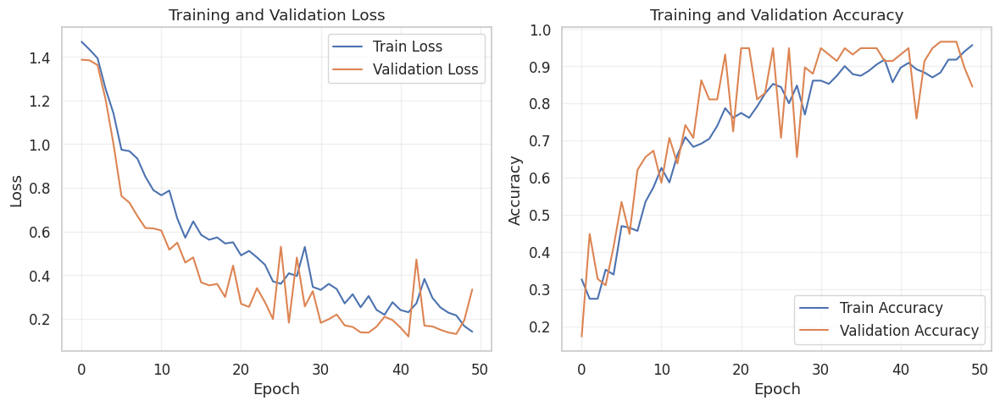


CNN Emotion Test Accuracy: 0.7812
CNN Emotion Test Loss: 0.5215


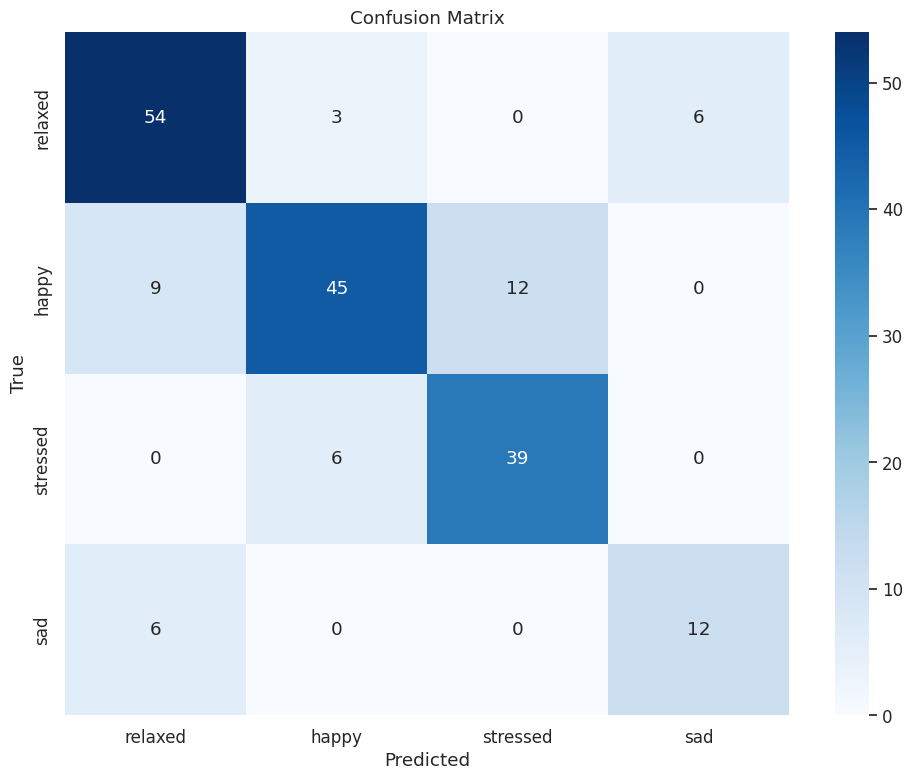

In [104]:
# First, make sure CNN features were created
if 'cnn_features' not in globals() or cnn_features is None:
    print("Creating CNN features for emotion classification...")
    cnn_features = create_cnn_feature_tensors(eeg_df_sorted, stats_df, band_power_df)
    
# Then train the CNN model for emotion classification
model, history, results = train_emotion_cnn_with_subject_split()


=== Training Feed-Forward Network for Emotion Classification ===
Loading training data from train_data.csv...
Loading test data from test_data.csv...
Found 334 feature columns and 3 target columns
Encoded emotion classes: ['happy', 'relaxed', 'sad', 'stressed']
Encoded valence classes: ['negative', 'positive']
Encoded arousal classes: ['high', 'low']
Data split: Train=691, Validation=173, Test=256
Epoch 1/50 | Train Loss: 1.1342, Train Acc: 0.5687 | Val Loss: 0.7965, Val Acc: 0.6069
Validation loss decreased (inf --> 0.796475). Saving model...
Epoch 2/50 | Train Loss: 0.6491, Train Acc: 0.7337 | Val Loss: 0.3774, Val Acc: 0.9017
Validation loss decreased (0.796475 --> 0.377388). Saving model...
Epoch 3/50 | Train Loss: 0.4109, Train Acc: 0.8292 | Val Loss: 0.2446, Val Acc: 0.9480
Validation loss decreased (0.377388 --> 0.244579). Saving model...
Epoch 4/50 | Train Loss: 0.2912, Train Acc: 0.8842 | Val Loss: 0.1600, Val Acc: 0.9653
Validation loss decreased (0.244579 --> 0.160016). Sav

/tmp/ipykernel_32942/1014005375.py:260: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Loaded emotion labels for 1120 samples
Using topographic maps tensor with shape: torch.Size([480, 5, 32, 32])

DEBUGGING INFO:
CNN metadata subject_id type: object
Emotion labels subject_id type: object
CNN metadata trial_num type: object
Emotion labels trial_num type: int64
Training on subjects: ['1', '10', '11', '12', '13', '15', '16', '17', '18', '19', '2', '21', '22', '23', '24', '27', '28', '29', '3', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '6', '7', '8']
Testing on subjects: ['14', '20', '25', '26', '30', '40', '5', '9', 'sub']
Matching CNN samples with emotion labels and subject split...
Total CNN samples: 480
Total emotion samples: 1120

Sample CNN metadata:
  subject_id trial_num
0          1         1
1          1         2
2          1         3

Sample emotion labels:
  subject_id trial_num  emotion
0          1         1  relaxed
1          1         1  relaxed
2          1         1  relaxed
Matched 480 out of 480 CNN samples with emotion labels
Found 2

/tmp/ipykernel_32942/1014005375.py:260: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


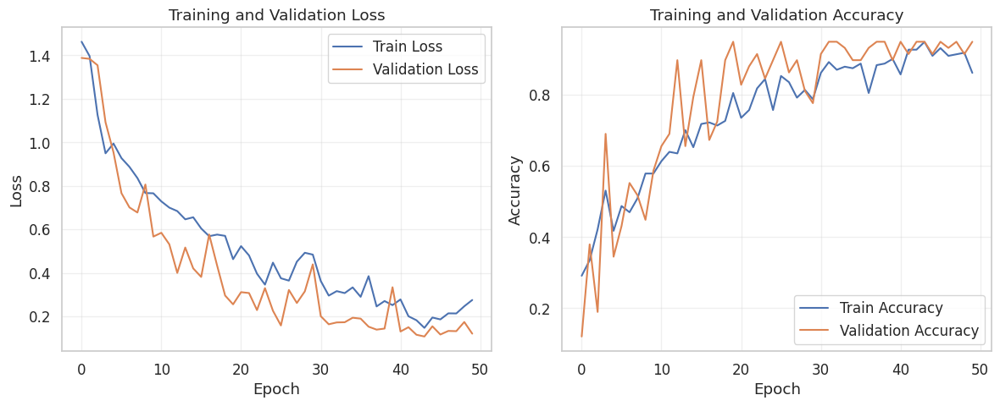


CNN Emotion Test Accuracy: 0.7969
CNN Emotion Test Loss: 0.6606


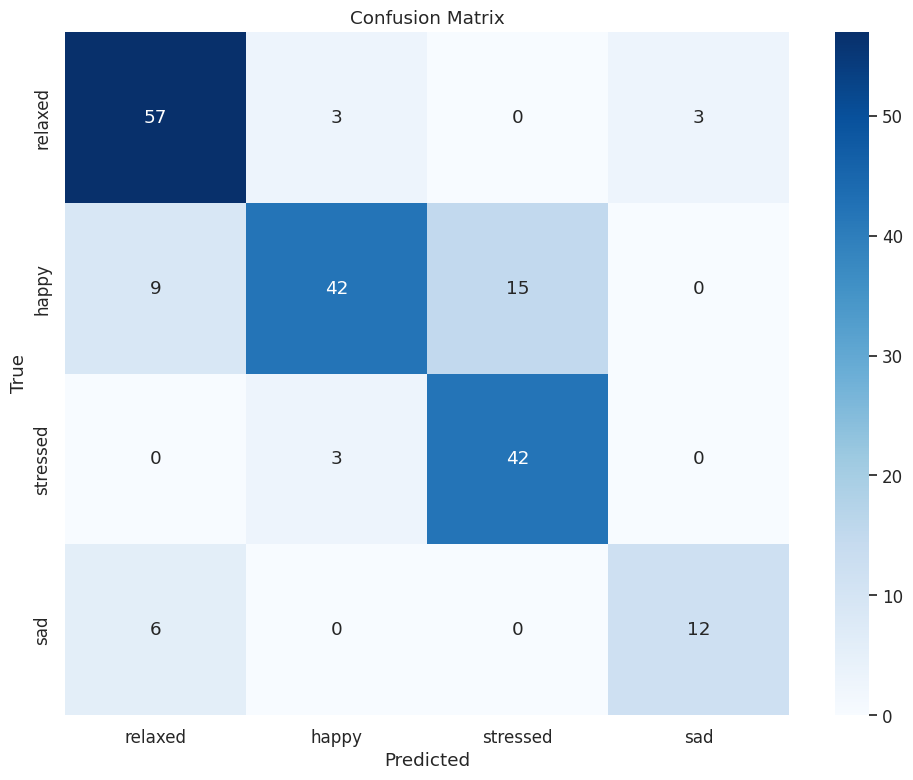


=== Model Comparison for Emotion Classification ===
FFN Test Accuracy: 0.8242
CNN Test Accuracy: 0.7969


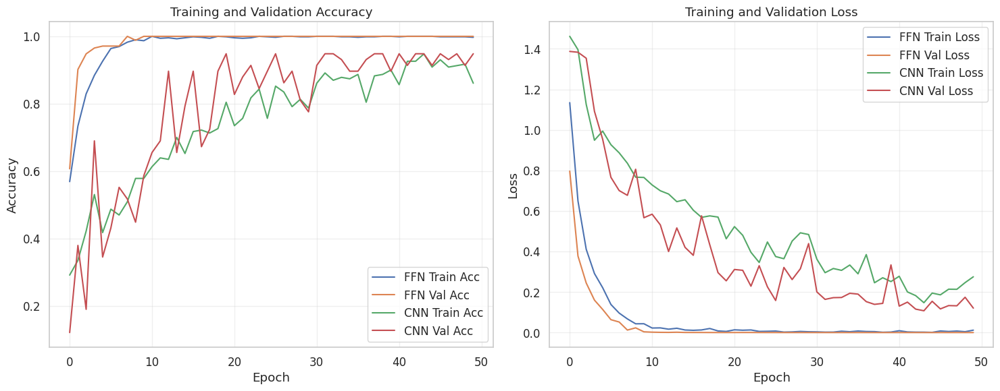

In [105]:
comparison_results = compare_emotion_classification_models()